# **Lab 4.2 NN MLP and CNN**

In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from collections import Counter
from mpl_toolkits.axes_grid1 import ImageGrid
from datetime import datetime
import os

Complete the `load_data()` function that loads the image using `ImageFolder()` with the specific `transforms.compose()` provided below.
`load_data()` will return `DataLoader()` and print the information about the Dataset.
This function must load only a pair of classes from the entire dataset.
Please ensure that the final image is in grayscale and has a size of 28x28.

`transforms.Compose()` :
- `transforms.Resize(32)`
- `transforms.ToTensor()`
- `transforms.Pad()`
- `transforms.RandomRotation(45),`
- `transforms.CenterCrop(28)`

Resource : [`transforms.Compose()`](https://pytorch.org/vision/main/generated/torchvision.transforms.Compose.html#compose), [`torchvision.transforms v1`](<https://pytorch.org/vision/stable/transforms.html#v1-api-reference:~:text=custom)%20tv_tensor%20type.-,V1%20API%20Reference,-Geometry>)

In [22]:
def get_base_dataset(ds):
    # ไล่ลึก dataset จริง (ไม่ใช่ Subset)
    while hasattr(ds, 'dataset'):
        ds = ds.dataset
    return ds

def show_subset_detail(subset, data_name):
    base_ds = get_base_dataset(subset)

    # ดึง mapping class_to_idx (ถ้ามี)
    if hasattr(base_ds, 'class_to_idx'):
        class_map = base_ds.class_to_idx
    else:
        class_map = {}

    # ดึง labels ของ subset ตาม indices
    if hasattr(subset, 'indices') and hasattr(base_ds, 'targets'):
        targets = [base_ds.targets[i] for i in subset.indices]
    elif hasattr(base_ds, 'targets'):
        targets = base_ds.targets
    elif hasattr(base_ds, 'labels'):
        targets = base_ds.labels
    else:
        targets = []

    class_counts = Counter(targets)

    print(f"{data_name} Dataset:")
    for label in sorted(class_counts.keys()):
        print(f"\tNumber of images in class {label}: {class_counts[label]}")

    print(f"\tNumber of {data_name.lower()} samples: {len(subset)}")

Use your `load_data()` function to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

```
📃Train Dataset:
	Number of images in class 0: 313
	Number of images in class 1: 308
	Number of training samples: 621

📃Test Dataset:
	Number of images in class 0: 75
	Number of images in class 1: 81
	Number of testing samples: 156
```


![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/03.png?raw=true)

</details>

📂 Already extracted at: thai-handwriting-number
Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 311
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


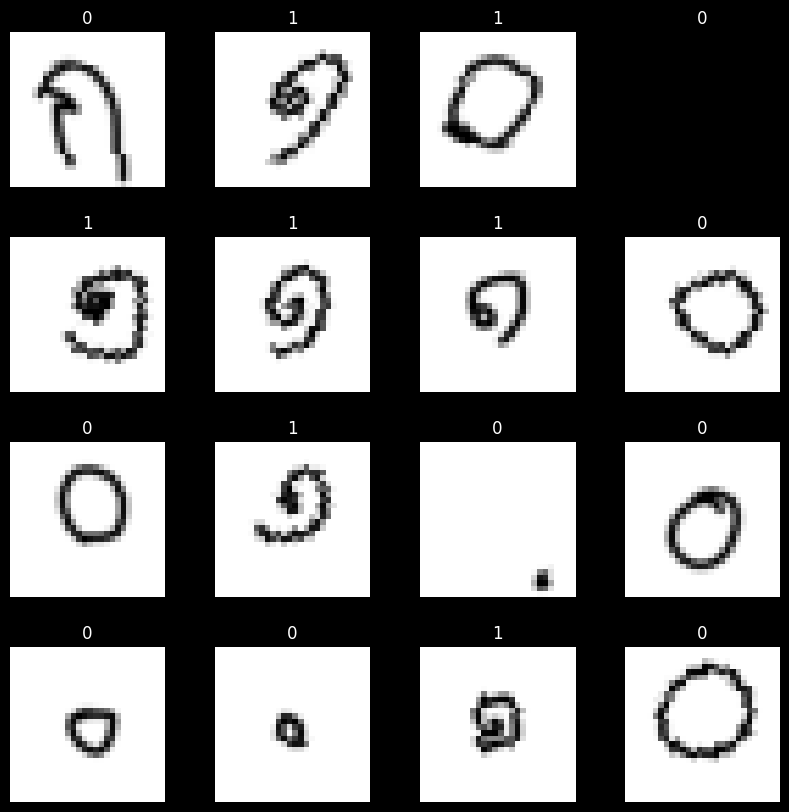

In [23]:
### START CODE HERE ###
def show_img(data_loader):
      
      images, labels = next(iter(data_loader))

      fig = plt.figure(figsize=(10, 10))
      plt.style.use('dark_background')

      grid = ImageGrid(fig, 111,
                        nrows_ncols=(4, 4),  
                        axes_pad=0.5,  
                        )

      for ax, im, lb in zip(grid, images, labels):
            im_np = im.permute(1, 2, 0).numpy()
            ax.axis('off')
            ax.set_title(str(lb.item()))
            ax.imshow(im_np, cmap='gray')

      plt.show()

def load_data(path,class_names):
    ### START CODE HERE ###
    transform = transforms.Compose([
        transforms.Grayscale(num_output_channels=1),
        transforms.Pad(20, padding_mode='edge'),
        transforms.Resize(32),
        transforms.RandomRotation(25, fill=255),
        transforms.CenterCrop(28),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])
    ])

    dataset = ImageFolder(root=path, transform=transform)

    class_to_idx = dataset.class_to_idx  
    selected_class_idxs = [class_to_idx[name] for name in class_names]

    indices = [i for i, (_, label) in enumerate(dataset) if label in selected_class_idxs]

    filtered_dataset = Subset(dataset, indices)     # สร้าง Subset ของ dataset เฉพาะ 2 คลาสนี้
    labels = [dataset.targets[i] for i in indices]  # ดึง label ของ subset สำหรับการแบ่ง train/test

    train_idx, test_idx = train_test_split(list(range(len(filtered_dataset))), test_size=0.2, stratify=labels, random_state=42) # แบ่ง train/test โดยใช้ sklearn

    train_dataset = Subset(filtered_dataset, train_idx)
    test_dataset = Subset(filtered_dataset, test_idx)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=True)

    show_subset_detail(train_dataset,"Train")
    show_subset_detail(test_dataset,"Test")
    show_img(train_loader)
    ### END CODE HERE ###
    
    return train_loader, test_loader

import zipfile
def unzip_data(zip_path, extract_to):
    if not os.path.exists(extract_to):
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_to)
            print(f"✅ Unzipped to: {extract_to}")
    else:
        print(f"📂 Already extracted at: {extract_to}")

unzip_data("thai-handwriting-number.appspot.com.zip", "thai-handwriting-number")

class_names = class_names = [f'{x}' for x in range(2)]
train_loader, test_loader = load_data("./thai-handwriting-number/thai-handwriting-number.appspot.com", class_names)
### END CODE HERE ###

**Create Models**
1. **NN (Neural Network)**:
- **Input**: 28x28 grayscale images (1 channel)
- **Architecture**: Single fully connected layer with sigmoid activation
- **Output**: Single neuron output with sigmoid activation
- **Description**: This is a simple feedforward neural network with a single fully connected layer. It takes input images, flattens them, passes through a fully connected layer, and applies sigmoid activation to produce the output.

2. **MLP (Multi-Layer Perceptron)**:
- **Input**: 28x28 grayscale images (1 channel)
- **Architecture**: Two fully connected layers with sigmoid activations
- **Output**: Single neuron output with sigmoid activation
- **Description**: This is a multi-layer perceptron with two fully connected layers. After flattening the input images, it passes through the first fully connected layer with sigmoid activation, followed by the second fully connected layer with sigmoid activation, producing the output.

3. **CNN (Convolutional Neural Network)**:
- **Input**: 28x28 grayscale images (1 channel)
- **Architecture**: Two convolutional layers with ReLU activations, followed by two fully connected layers with ReLU activations
- **Output**: Single neuron output with sigmoid activation
- **Description**: This is a convolutional neural network with two convolutional layers followed by two fully connected layers. It applies convolutional operations with ReLU activations, followed by flattening the output and passing through fully connected layers with ReLU activations. Finally, it produces a single neuron output with sigmoid activation.


Every model should have a `get_features()` method that returns the result from all layers.

In [24]:
### START CODE HERE ###

class NN(nn.Module):
    def __init__(self):
        super(NN, self).__init__()

        self.flatten = nn.Flatten()
        self.fc = nn.Linear(28*28,1)
        self.sigmoid = nn.Sigmoid()

    def get_features(self, x):

        features = {}

        print(x.shape)
        features['ori'] = x.detach().cpu()

        x = self.flatten(x)
        print(x.shape)
        features['flatten'] = x.detach().cpu()
        
        x = self.fc(x)
        print(x.shape)
        features['fc'] = x.detach().cpu()
        print(f"FC values: min={x.detach().cpu().min():.3f}, max={x.detach().cpu().max():.3f}")

        x = self.sigmoid(x)
        print(x.shape)
        features['sigmoid'] = x.detach().cpu()
        print(f"sigmoid values: min={x.detach().cpu().min():.3f}, max={x.detach().cpu().max():.3f}")

        return features

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc(x)
        x = self.sigmoid(x)
        return x
    
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(28 * 28, 48)      # ชั้นที่ 1
        self.sigmoid1 = nn.Sigmoid()
        self.fc2 = nn.Linear(48, 1)            # ชั้นที่ 2 (output)
        self.sigmoid2 = nn.Sigmoid()
        
    def get_features(self, x):
        features = {}
        
        features['input'] = x.detach().cpu()
        
        x = self.flatten(x)
        features['flatten'] = x.detach().cpu()
        
        x = self.fc1(x)
        features['fc1'] = x.detach().cpu()
        
        x = self.sigmoid1(x)
        features['sigmoid1'] = x.detach().cpu()
        
        x = self.fc2(x)
        features['fc2'] = x.detach().cpu()
        
        x = self.sigmoid2(x)
        features['sigmoid2'] = x.detach().cpu()
        
        return features

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.sigmoid1(x)
        x = self.fc2(x)
        x = self.sigmoid2(x)
        return x
    
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, padding=1)  # (1 input channel → 16 filters)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1) # (16 → 32 filters)

        self.pool = nn.MaxPool2d(2, 2)  # reduce spatial size

        # Fully connected layers
        self.fc1 = nn.Linear(32 * 7 * 7, 128)  # Flattened after pooling
        self.fc2 = nn.Linear(128, 1)

        self.sigmoid = nn.Sigmoid()

    def get_features(self, x):
        features = {}

        features['input'] = x.detach().cpu()

        x = self.conv1(x)
        features['conv1'] = x.detach().cpu()
        x = F.relu(x)

        x = self.pool(x)
        features['pool1'] = x.detach().cpu()

        x = self.conv2(x)
        features['conv2'] = x.detach().cpu()
        x = F.relu(x)

        x = self.pool(x)
        features['pool2'] = x.detach().cpu()

        x = x.view(x.size(0), -1)  # Flatten
        features['flatten'] = x.detach().cpu()

        x = self.fc1(x)
        features['fc1'] = x.detach().cpu()
        x = F.relu(x)

        x = self.fc2(x)
        features['fc2'] = x.detach().cpu()

        x = self.sigmoid(x)
        features['output'] = x.detach().cpu()

        return features

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        x = x.view(x.size(0), -1)  # Flatten
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        x = self.sigmoid(x)
        return x

### END CODE HERE ###

Complete the function below. This function will be used to display the feature map from the models at every epoch on TensorBoard.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output that will be display on TensorBoard</b>
</font>
</summary>

- The output should resemble this, but not be identical
- `NN()`<br>
![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/04.png?raw=true)
- `MLP()`<br>
![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/05.png?raw=true)
- `CNN()`<br>
![image-3.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/06.png?raw=true)
</details>

In [25]:
from matplotlib import colors

def show_featuremaps(features):
    ### START CODE HERE ###
    fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))
    plt.style.use('dark_background')

    for ax, (name, feat) in zip(axs, features.items()):
        f = feat[0].cpu().numpy()  # ใช้ sample แรก
        print(f.ndim, f.shape[0])

        if f.ndim == 3:
            # รูปภาพต้นฉบับ (C, H, W)
            if f.shape[0] == 1:
                f = f[0]  # ถ้าเป็น grayscale
                ax.imshow(f)
            else:
                channels = []
                for i in range(f.shape[0]):  # วนลูป 16 channels
                    channels.append(f[i])  # เอาแต่ละ channel (28, 28)
                # ต่อกันแนวตั้ง (stack vertically)
                f_stacked = np.vstack(channels)  # (16*28, 28) = (448, 28)
                ax.imshow(f_stacked)

        elif f.ndim == 1:
            if f.shape[0] > 1:
                ax.imshow(f.reshape(-1, 1), aspect='auto')
            else:
                f_display = np.array([[f.item()]])
                ax.imshow(f_display, aspect='auto', vmin=0, vmax=1)

        ax.set_title(name)
        ax.axis('off')
    return fig

# def load_image(filepath):
#     transform = transforms.Compose([
#         transforms.Grayscale(num_output_channels=1),  # เปลี่ยนเป็น grayscale
#         transforms.Resize((28, 28)),                  # ปรับขนาด
#         transforms.ToTensor(),                        # แปลงเป็น tensor (C, H, W)
#     ])
#     image = Image.open(filepath)
#     tensor = transform(image)  # shape: (1, 28, 28)
    return tensor.unsqueeze(0) # เพิ่ม batch dim → shape: (1, 1, 28, 28)

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=0.379, max=1.251
torch.Size([16, 1])
sigmoid values: min=0.594, max=0.777
3 1
1 784
1 1
1 1


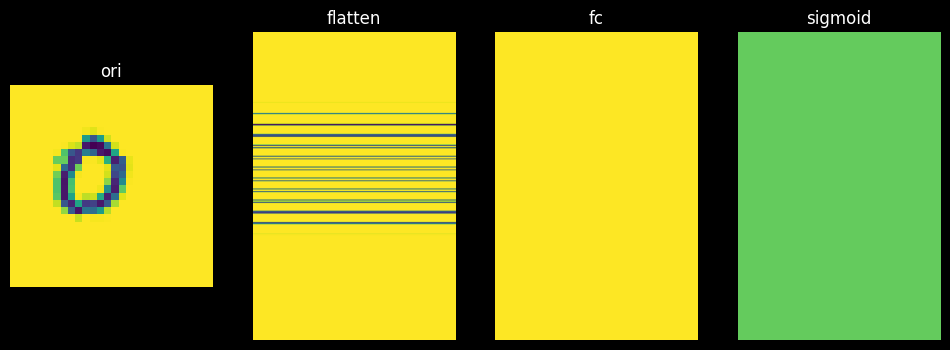

In [26]:
nn_model = NN()
data_iter = iter(train_loader)
input_tensor, _ = next(data_iter)
output= nn_model(input_tensor)
features = nn_model.get_features(input_tensor) 
fig = show_featuremaps(features)
plt.show() 

3 1
1 784
1 48
1 48
1 1
1 1


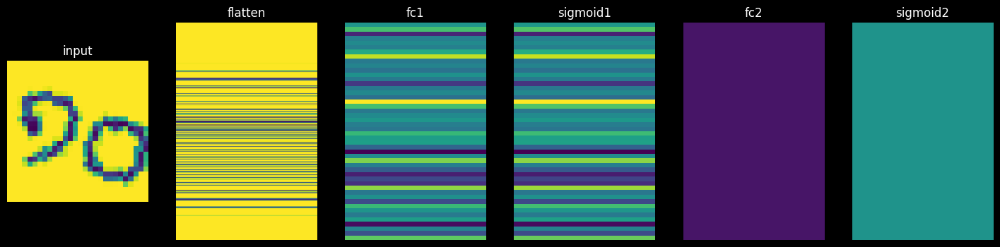

In [27]:
mlp_model = MLP()
data_iter = iter(train_loader)
input_tensor, _ = next(data_iter)
output= mlp_model(input_tensor)
features = mlp_model.get_features(input_tensor) 
fig = show_featuremaps(features)
plt.show() 

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


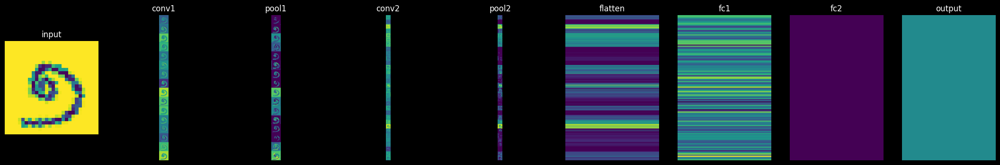

In [28]:
cnn_model = CNN()
data_iter = iter(train_loader)
input_tensor, _ = next(data_iter)
output= cnn_model(input_tensor)
features = cnn_model.get_features(input_tensor) 
fig = show_featuremaps(features)
plt.show() 

TensorBoard 101

Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the training loss/accuracy, test loss/accuracy, and display the feature map from all layers of the model at every epoch on TensorBoard. Additionally, it should save the model at the last epoch.

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [TensorBoard](https://pytorch.org/docs/stable/tensorboard.html)

<details>
<summary>
<font size="3" color="orange">
<b>Expected output that will be display on TensorBoard</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/07.png?raw=true)

![image-2.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/08.png?raw=true)
</details>

In [29]:
from torchvision.utils import make_grid
from PIL import Image
import io
import numpy as np
import torchvision.transforms as transforms

def fig_to_tensor(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png')
    buf.seek(0)
    image = Image.open(buf).convert('RGB')
    transform = transforms.ToTensor()
    return transform(image)

def train(class_names,model,opt,loss_fn,train_loader,test_loader,epochs=10,writer=None,checkpoint_path=None,device='cpu'):
    ### START CODE HERE ###
    
    model = model.to(device)
    class_map = {int(class_names[0]): 0, int(class_names[1]): 1}
    history = {
        'train_loss':[],
        'train_acc':[],
        'test_loss':[],
        'test_acc':[]
    }

    for epoch in range(epochs):
        model.train()
        train_bar = tqdm(train_loader, desc=f'Training Epoch [{epoch+1}/{epochs}]', unit='batch')

        total_train_loss = 0
        total_train_correct = 0

        for batch_idx, (images, labels) in enumerate(train_bar):
            images = images.to(device)
            labels = labels.cpu().numpy()
            labels = torch.tensor([class_map[int(l)] for l in labels], dtype=torch.float32, device=device).unsqueeze(1)

            opt.zero_grad()
            output = model(images)
            loss = loss_fn(output, labels)
            loss.backward()
            opt.step()
            
            total_train_loss += loss.item()
            predicted = (output > 0.6).long()  # output เป็น sigmoid -> 0~1
            total_train_correct += (predicted == labels).sum().item()

            train_bar.set_postfix(loss=loss.item())
            
        # print("output: ",output.squeeze().tolist())
        # print("Predicted: ", predicted.squeeze().tolist())
        # print("Label:     ", labels.squeeze().long().tolist())
        
        avg_train_loss = total_train_loss/len(train_loader)
        avg_train_acc = total_train_correct/len(train_loader.dataset)
        
        history['train_loss'].append(avg_train_loss)
        history['train_acc'].append(avg_train_acc)


        #testing-----------------------------------------------------------------------------------
        model.eval()
        test_bar = tqdm(test_loader, desc='Testing 🧐🧐', unit='batch')

        total_test_loss = 0
        total_test_correct = 0

        with torch.no_grad():
            for images, labels in test_bar:
                images = images.to(device)
                labels = labels.cpu().numpy()
                labels = torch.tensor([class_map[int(l)] for l in labels], dtype=torch.float32, device=device).unsqueeze(1)

                
                # labels = labels.to(device)
                # labels = labels.float().unsqueeze(1)

                output = model(images)
                loss = loss_fn(output, labels)

                total_test_loss += loss.item()
                predicted = (output > 0.6).long()
                total_test_correct += (predicted == labels).sum().item()

                test_bar.set_postfix(loss=loss.item())
        
        avg_test_loss = total_test_loss / len(test_loader)
        avg_test_acc = total_test_correct / len(test_loader.dataset)

        history['test_loss'].append(avg_test_loss)
        history['test_acc'].append(avg_test_acc)

        if epoch == epochs-1:
            print(f"Epoch {epoch+1}, Loss: {avg_train_loss:.4f}, Accuracy: {avg_train_acc:.4f}, Test Loss: {avg_test_loss:.4f}, Test Accuracy: {avg_test_acc:.4f}\n")

        if writer:
            writer.add_scalar("Loss/train", avg_train_loss, epoch)
            writer.add_scalar("Accuracy/train", avg_train_acc, epoch)
            writer.add_scalar("Loss/test", avg_test_loss, epoch)
            writer.add_scalar("Accuracy/test", avg_test_acc, epoch)

            # Log feature map images
            sample_iter = iter(train_loader)
            input_tensor, _ = next(sample_iter)
            input_tensor = input_tensor.to(device)
            _ = model(input_tensor)  # forward pass
            features = model.get_features(input_tensor)
            fig = show_featuremaps(features)
            image_tensor = fig_to_tensor(fig)
            writer.add_image('Feature Maps', image_tensor, epoch)

            writer.flush() 

        if checkpoint_path and epoch == epochs-1:
            os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)
            model_path = checkpoint_path
            torch.save(model.state_dict(), model_path)

        # data_iter = iter(train_loader)
        # input_tensor, _ = next(data_iter)
        # output= cnn_model(input_tensor)
        # features = cnn_model.get_features(input_tensor) 
        # fig = show_featuremaps(features)
        # #add image to tensorboard
        # writer.add_image('Input Images', fig, epoch)
        
    writer.close()
    return history

    ### END CODE HERE ###

Use your `train()` function to train all types of models with all combinations of numbers that you've obtained.

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 311
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


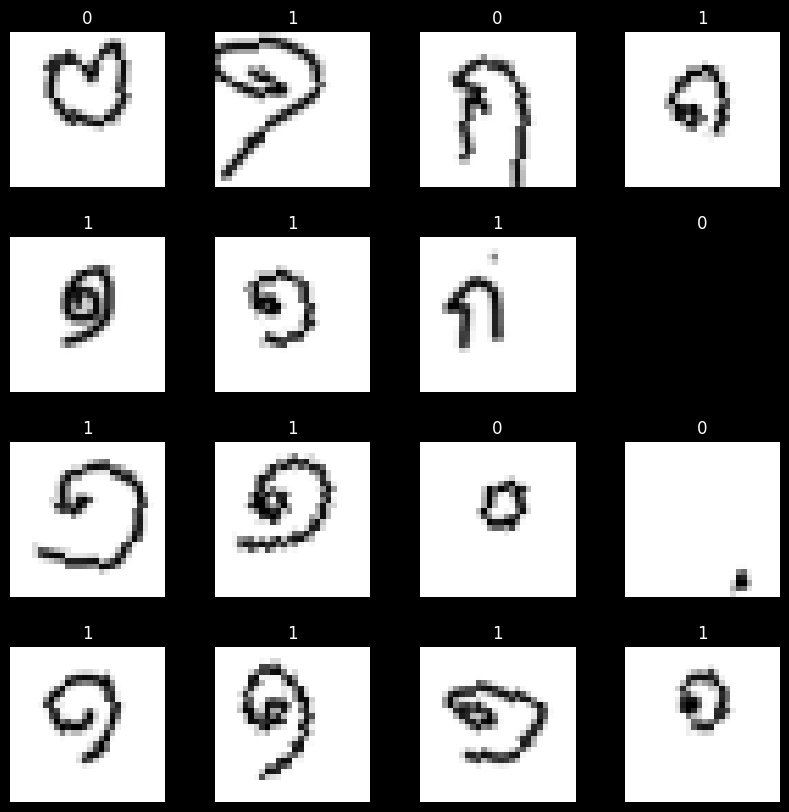

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 311
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


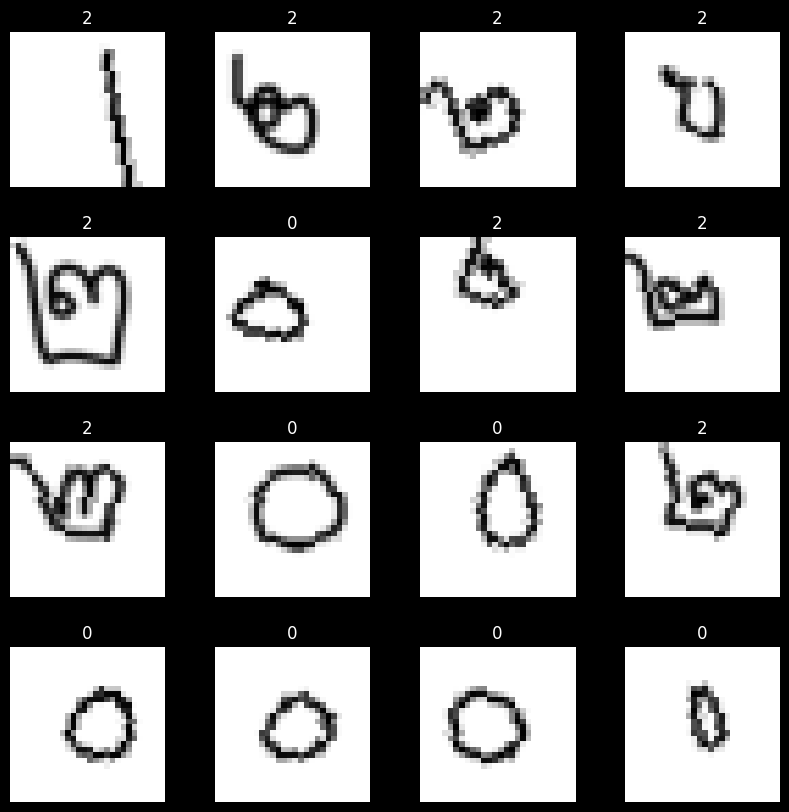

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


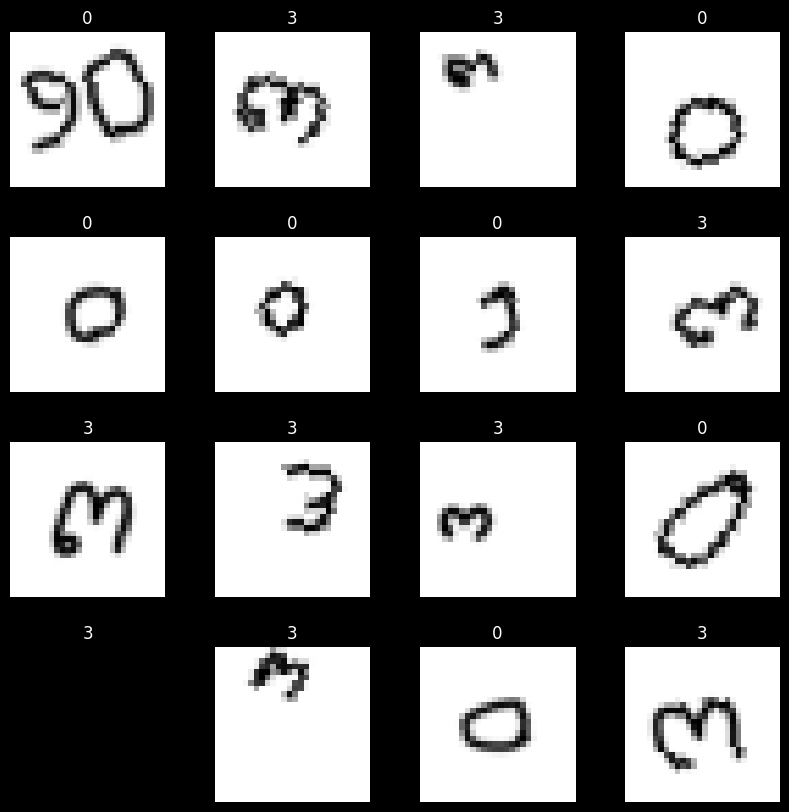

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


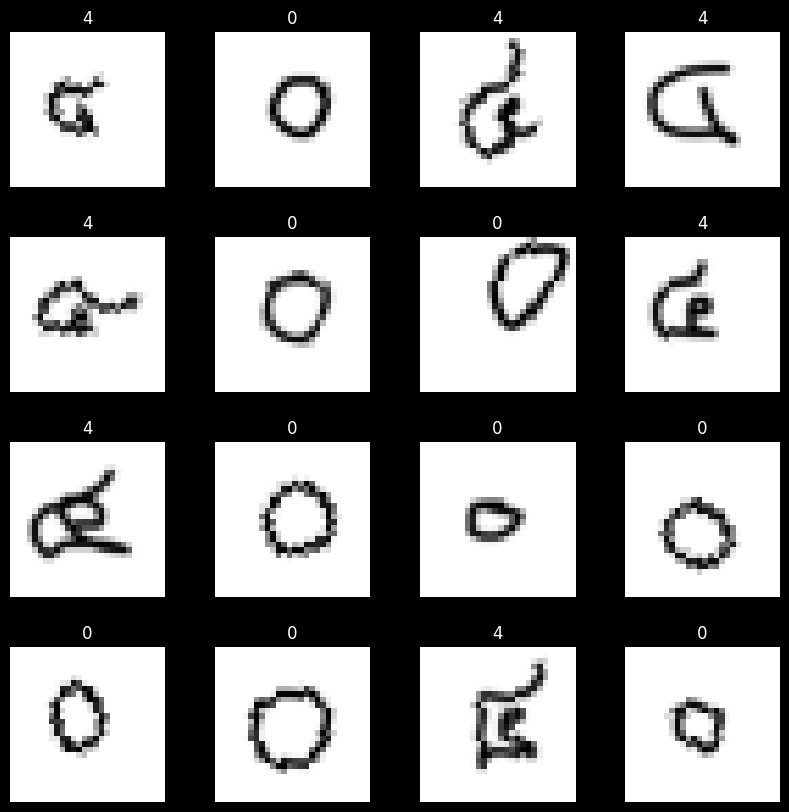

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


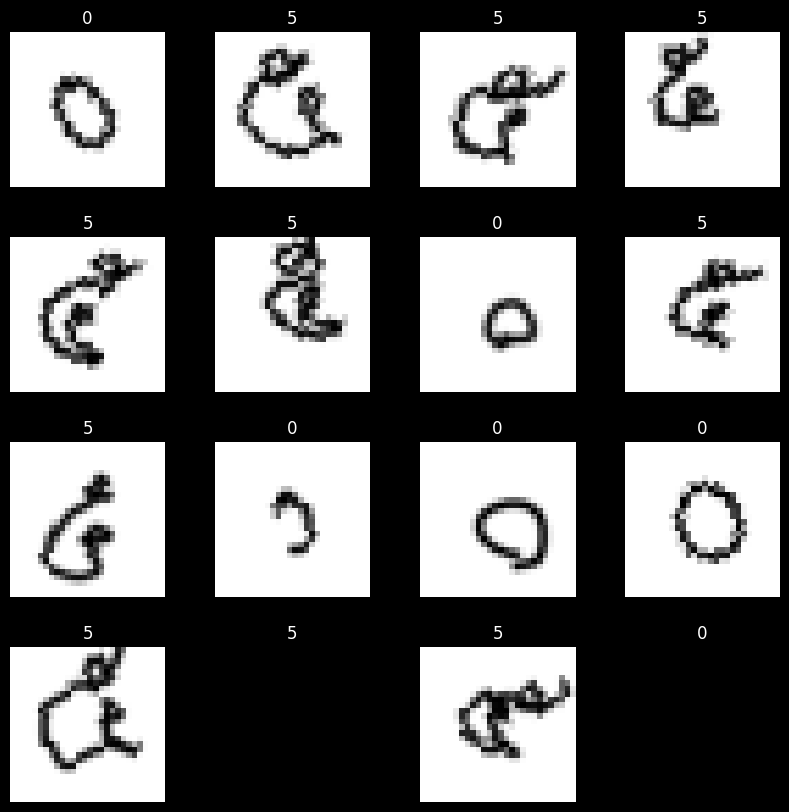

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


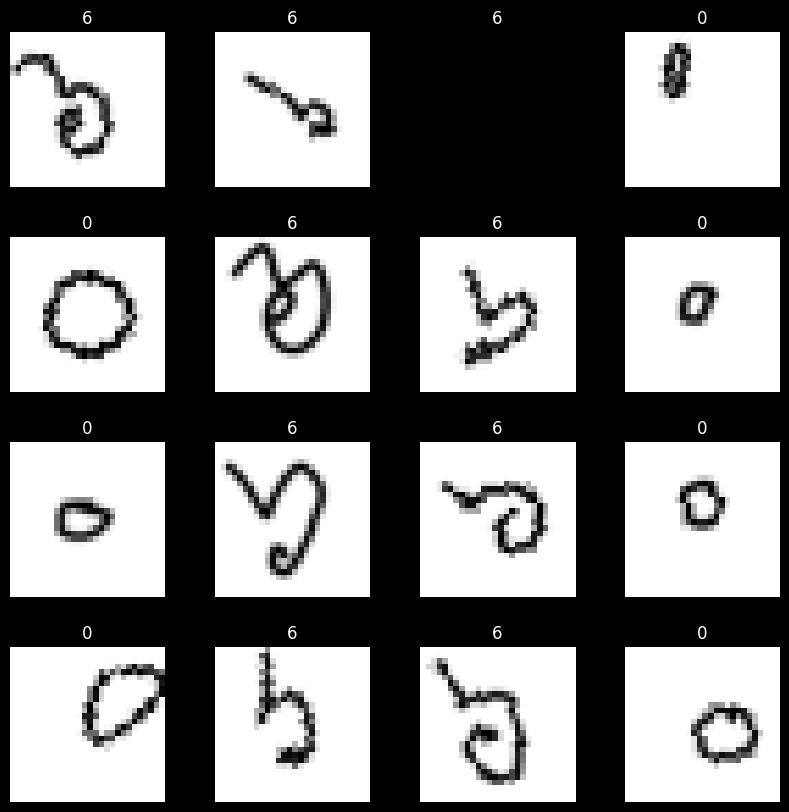

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


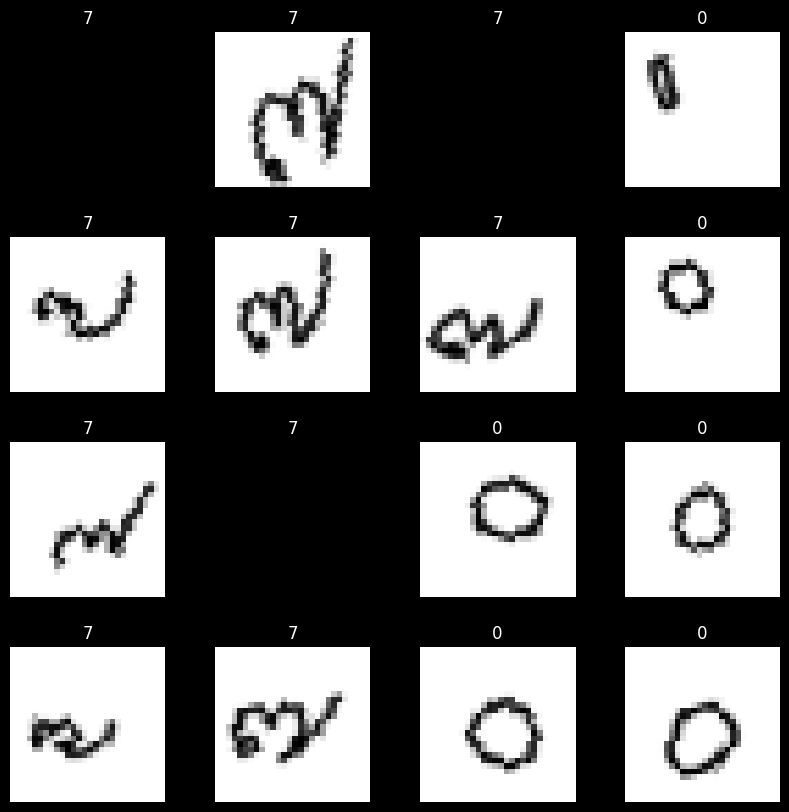

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


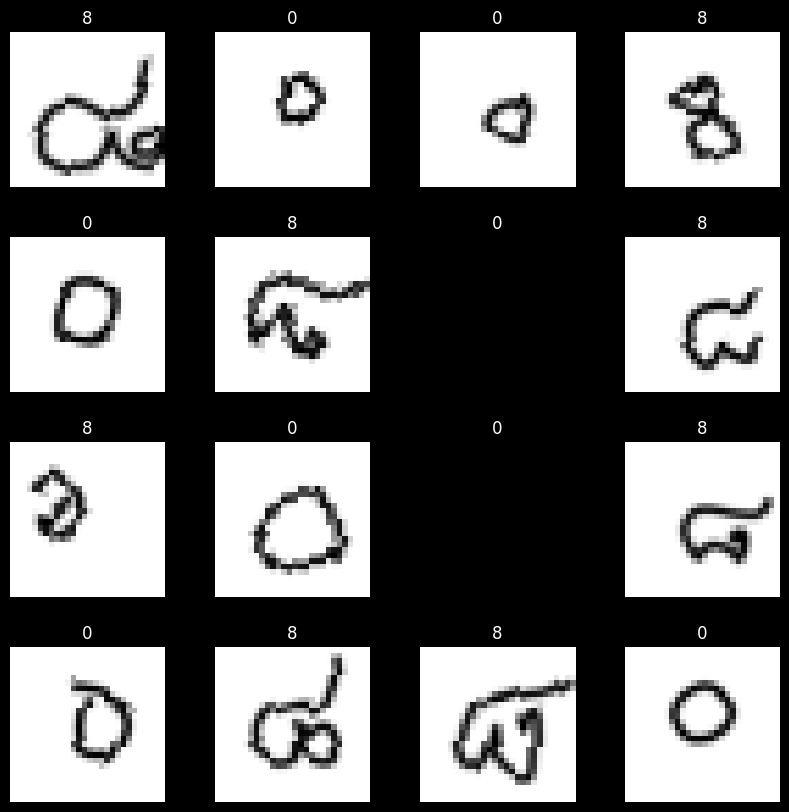

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


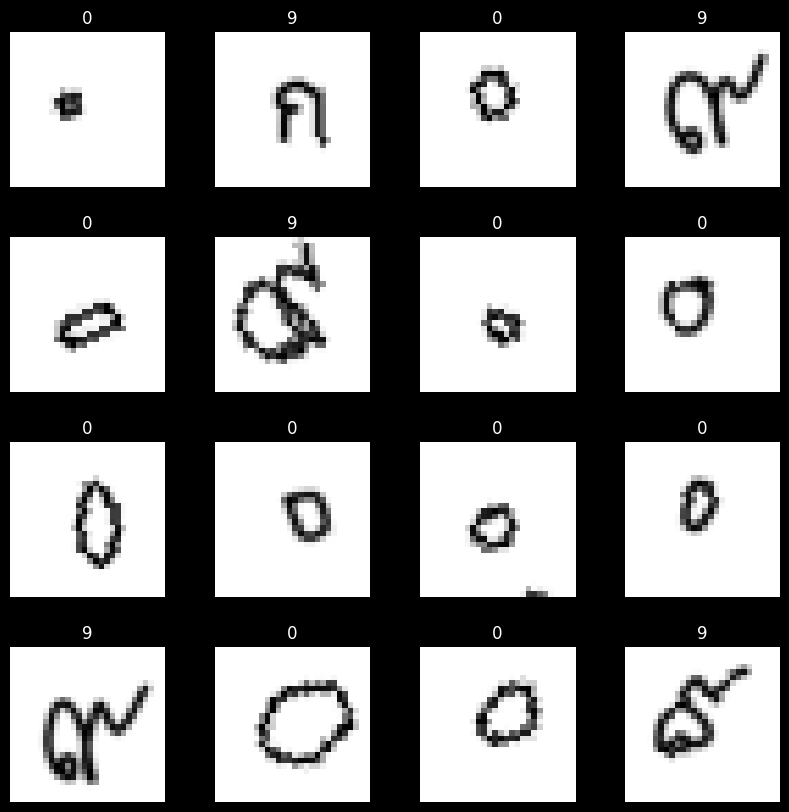

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of images in class 2: 1
	Number of train samples: 622
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


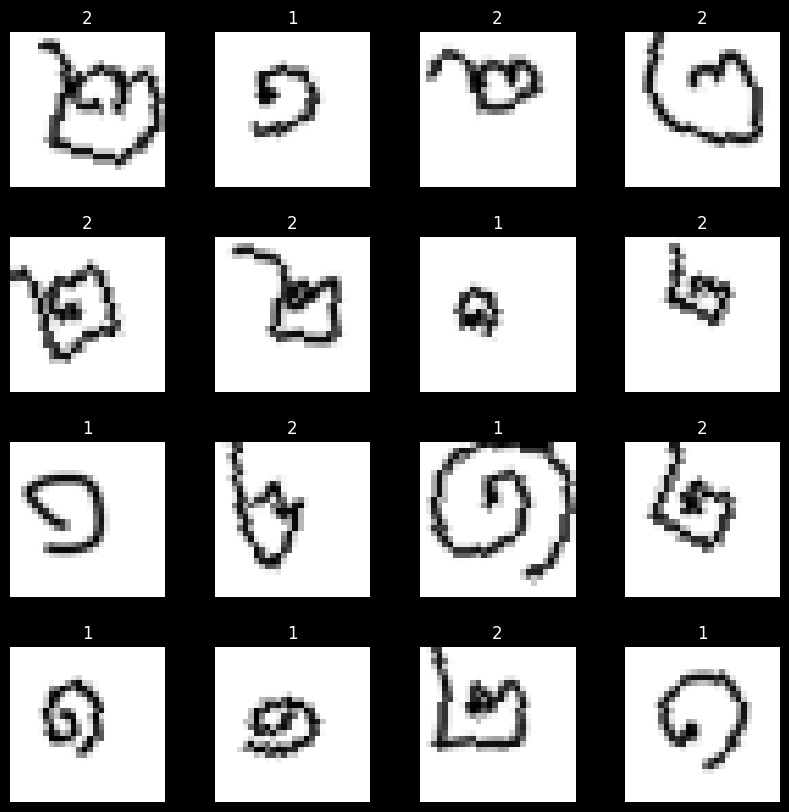

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


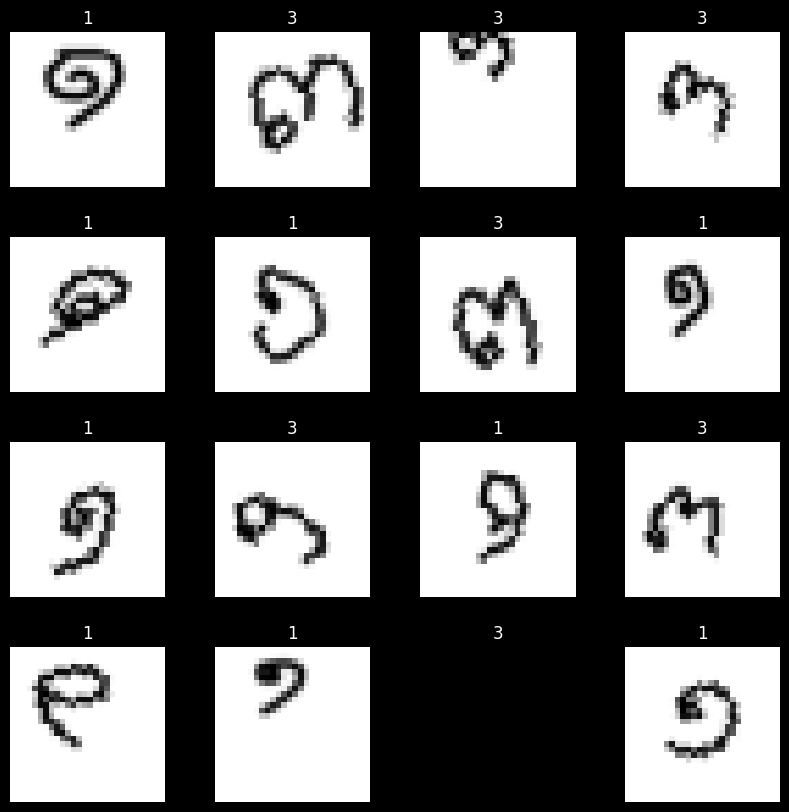

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


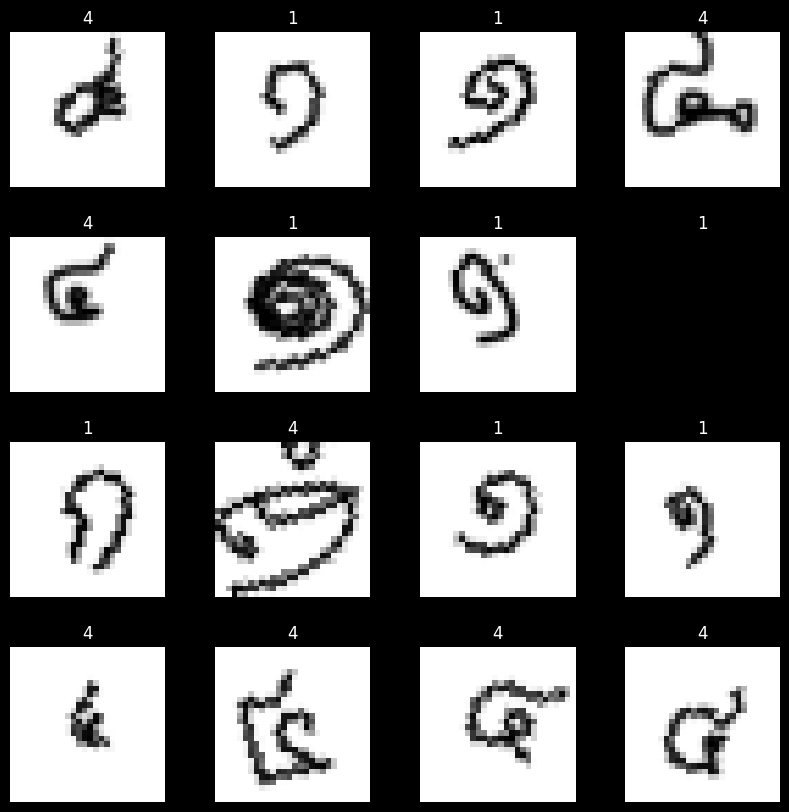

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


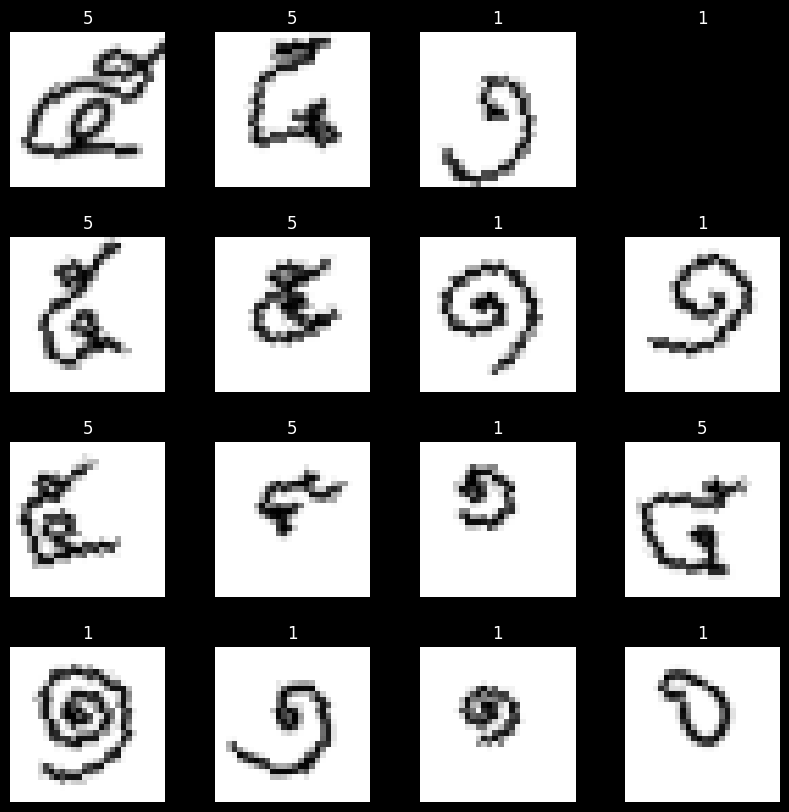

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


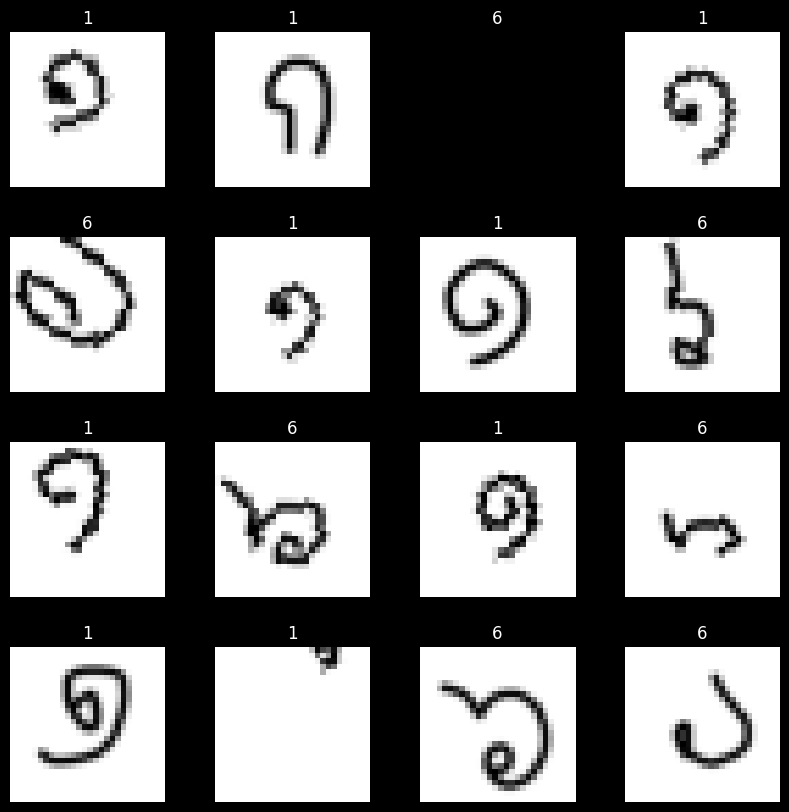

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


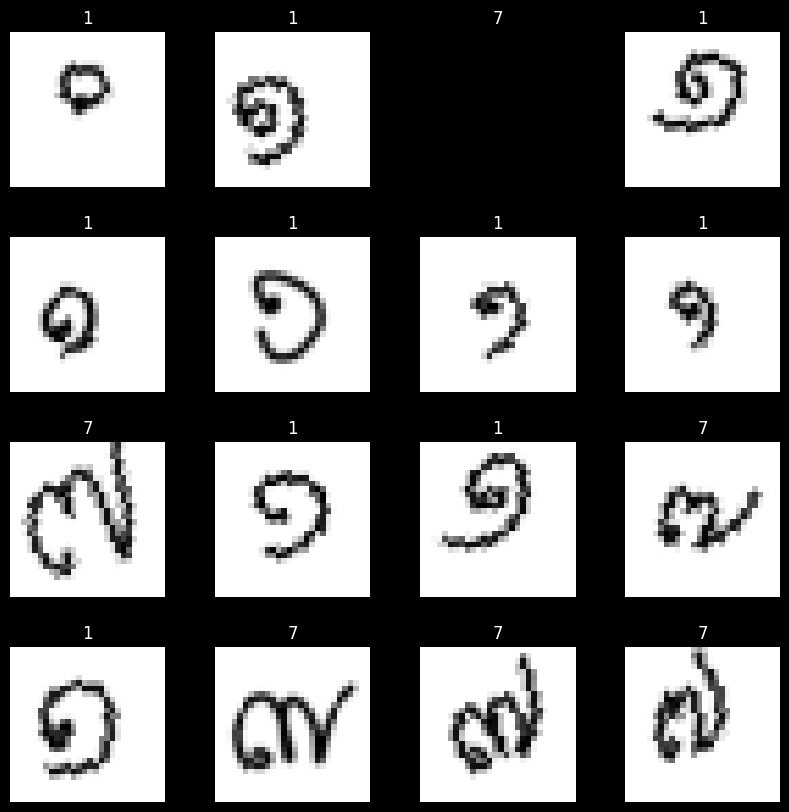

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


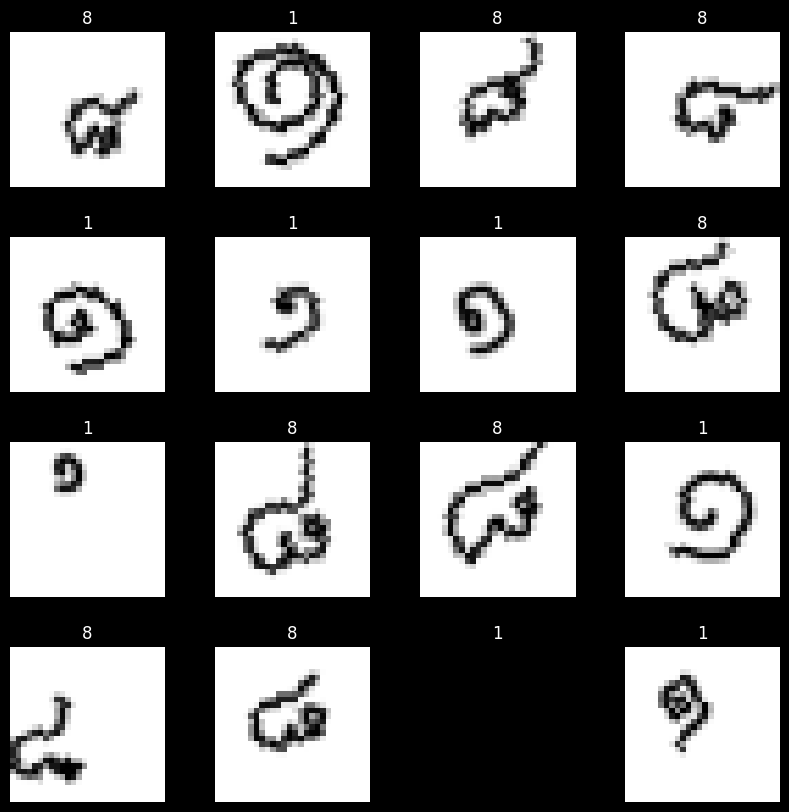

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


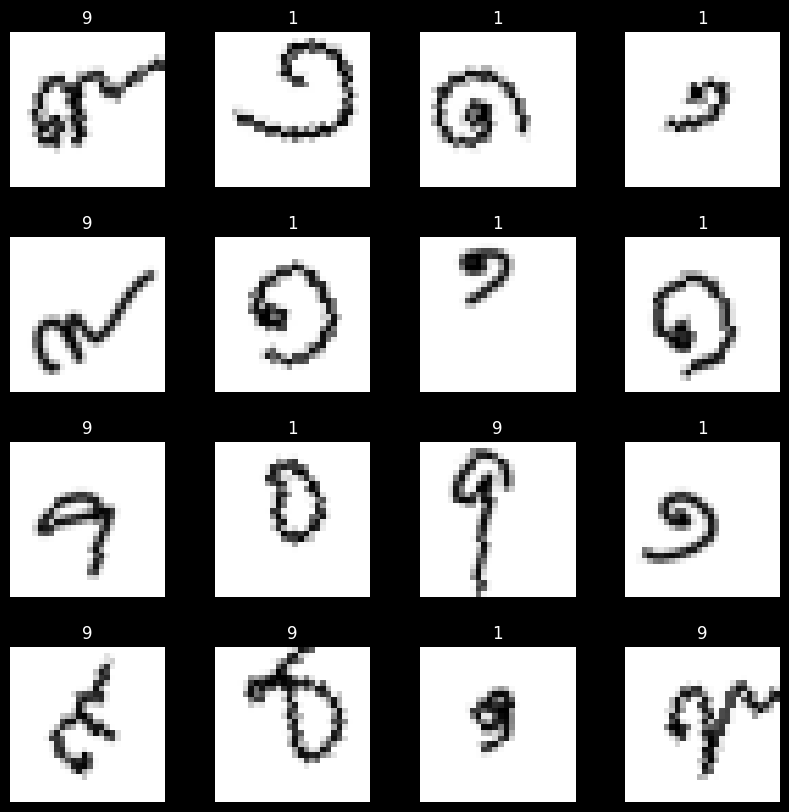

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


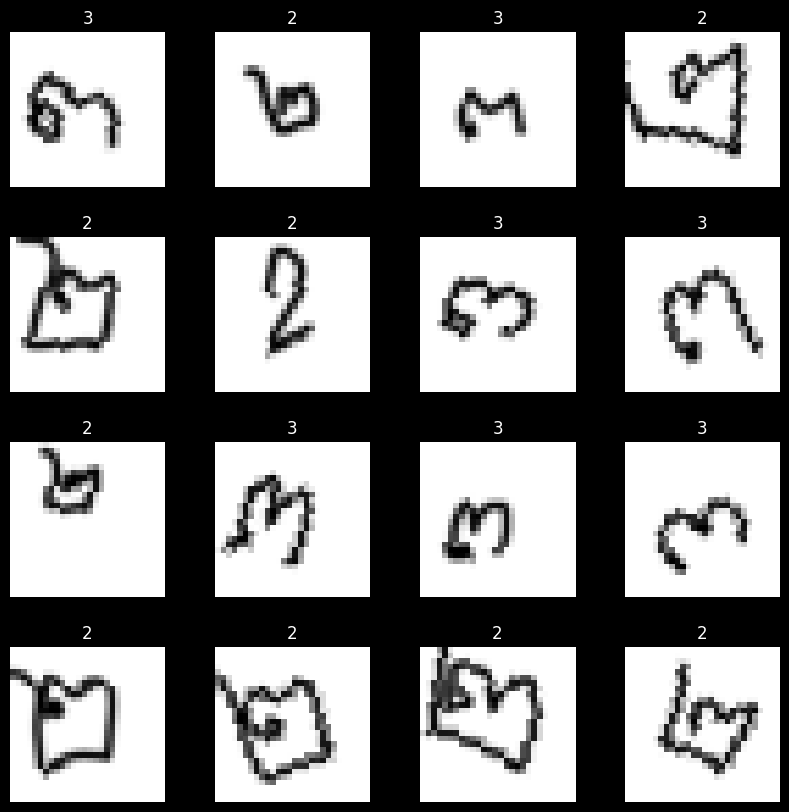

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


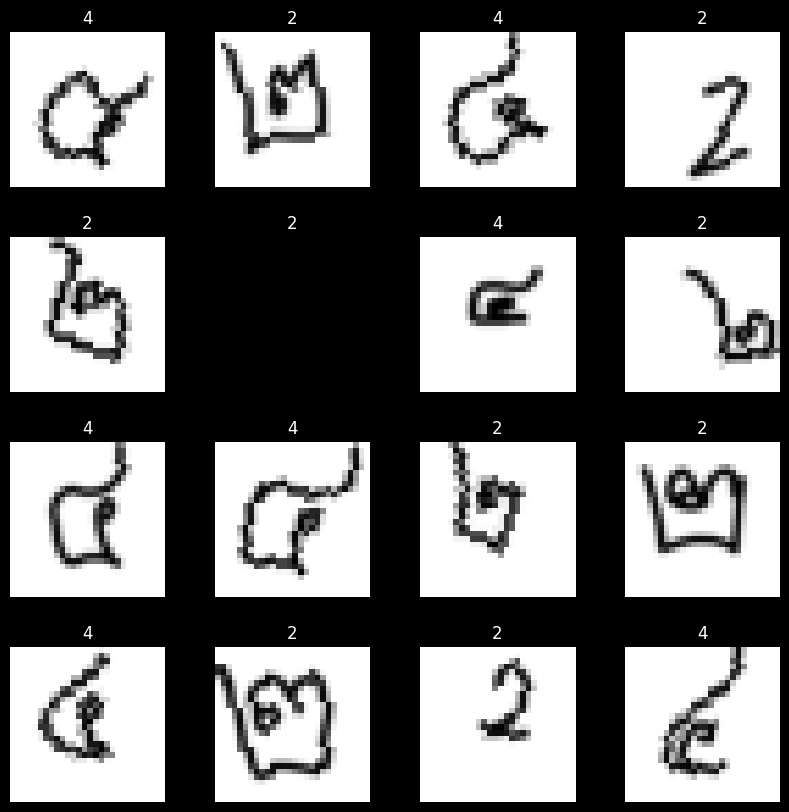

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


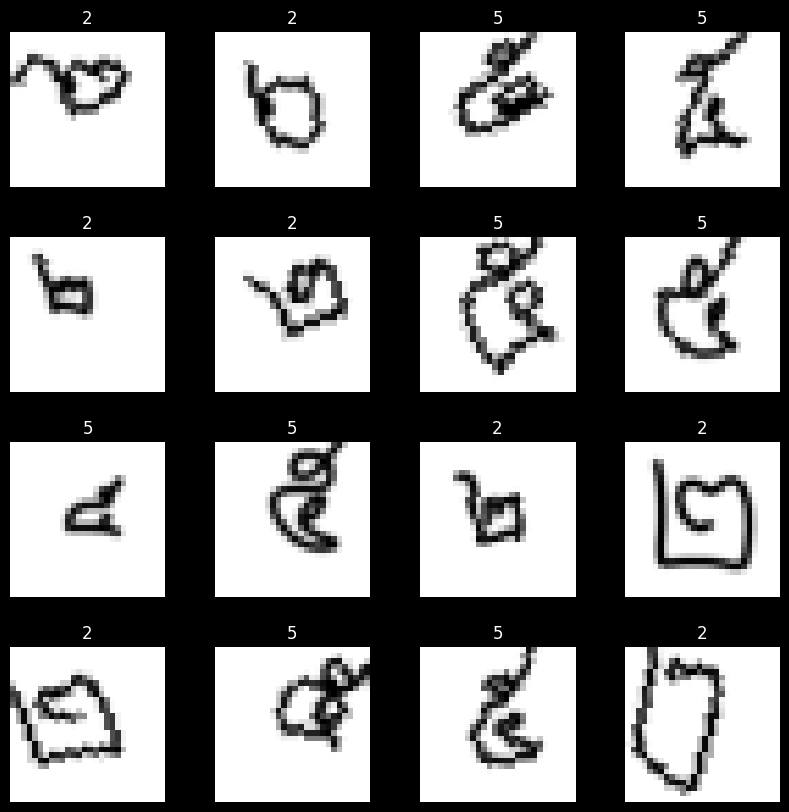

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


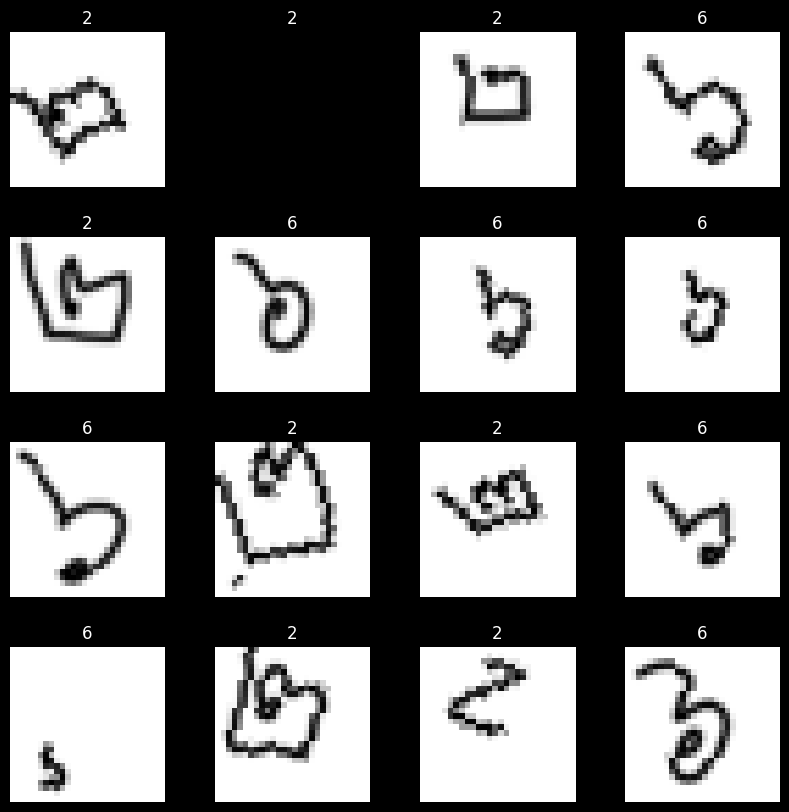

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


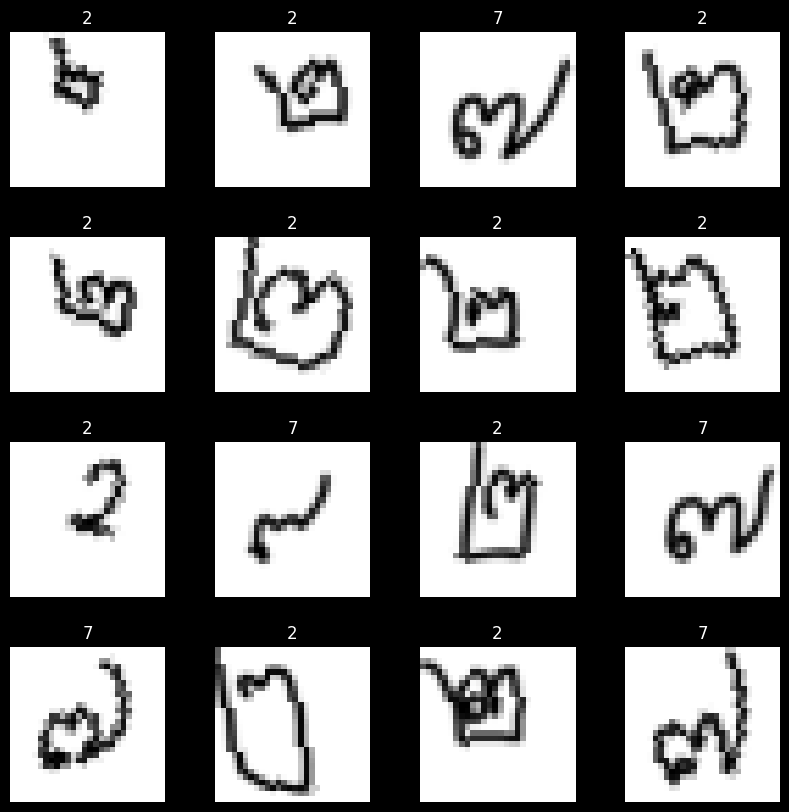

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


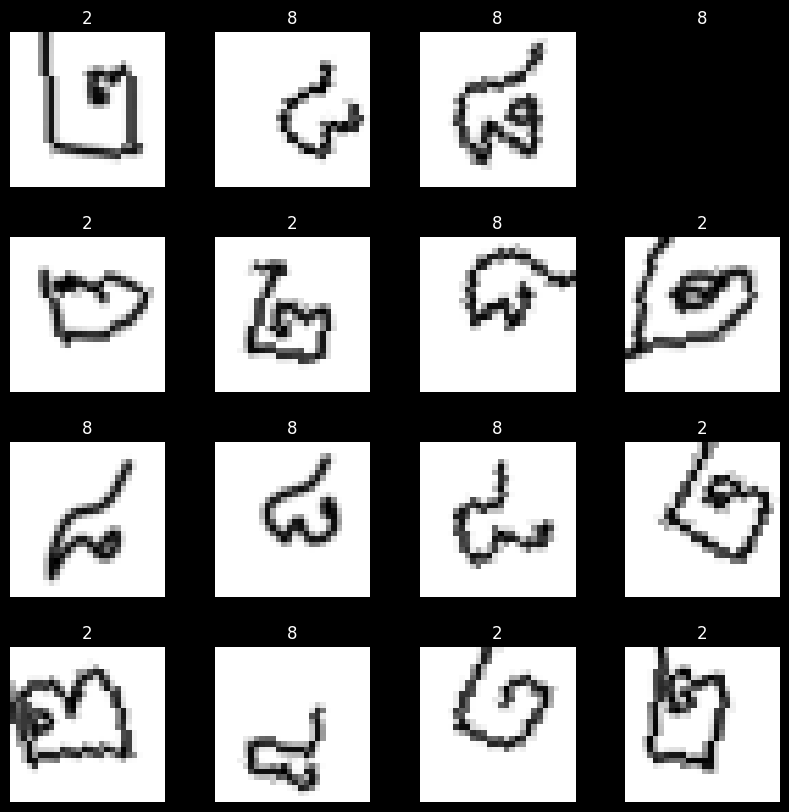

Train Dataset:
	Number of images in class 0: 311
	Number of images in class 1: 310
	Number of train samples: 621
Test Dataset:
	Number of images in class 0: 77
	Number of images in class 1: 79
	Number of test samples: 156


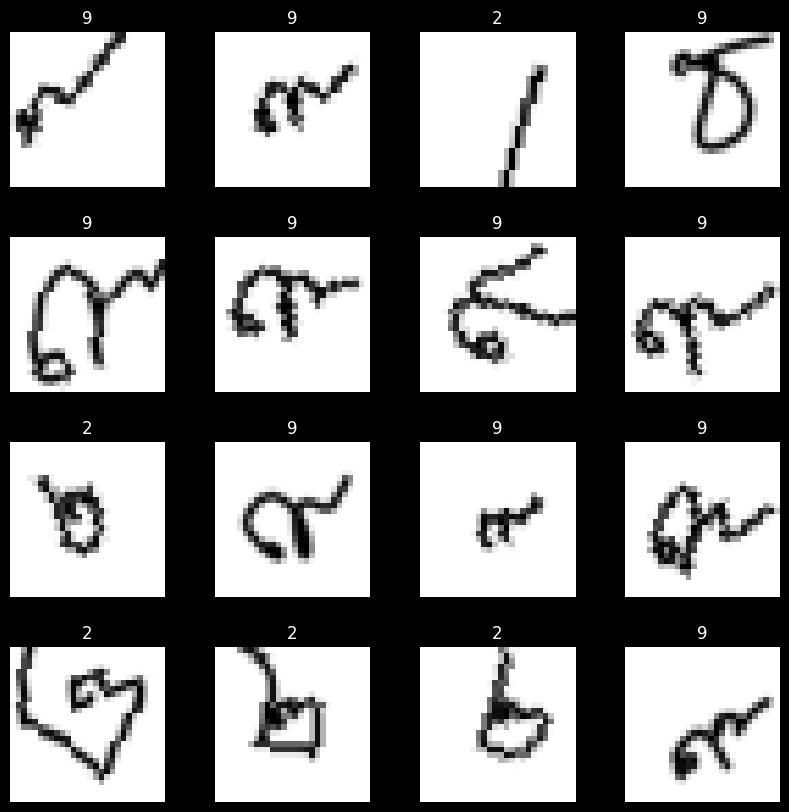

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


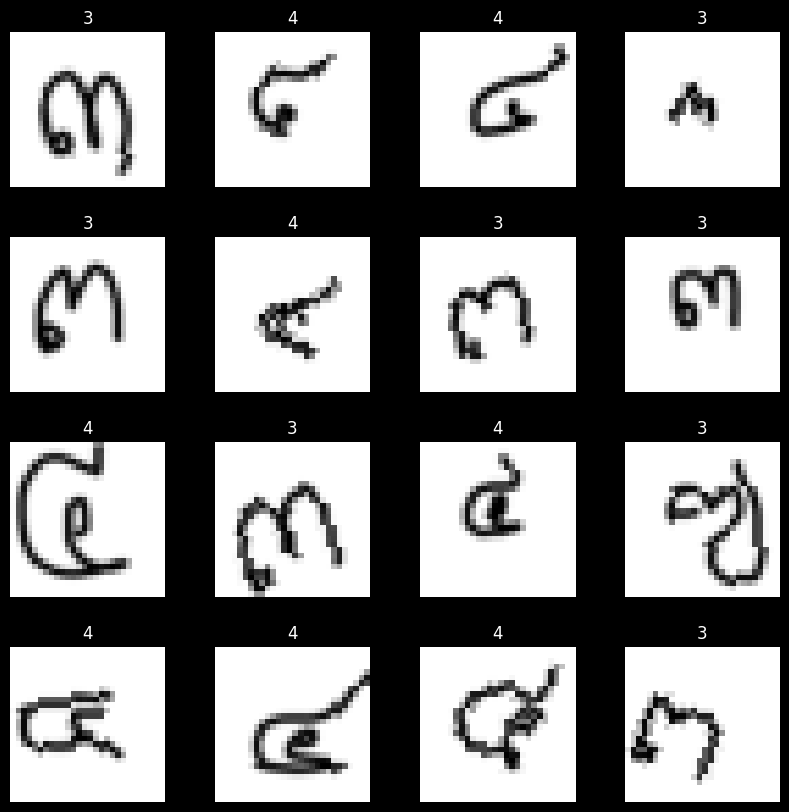

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


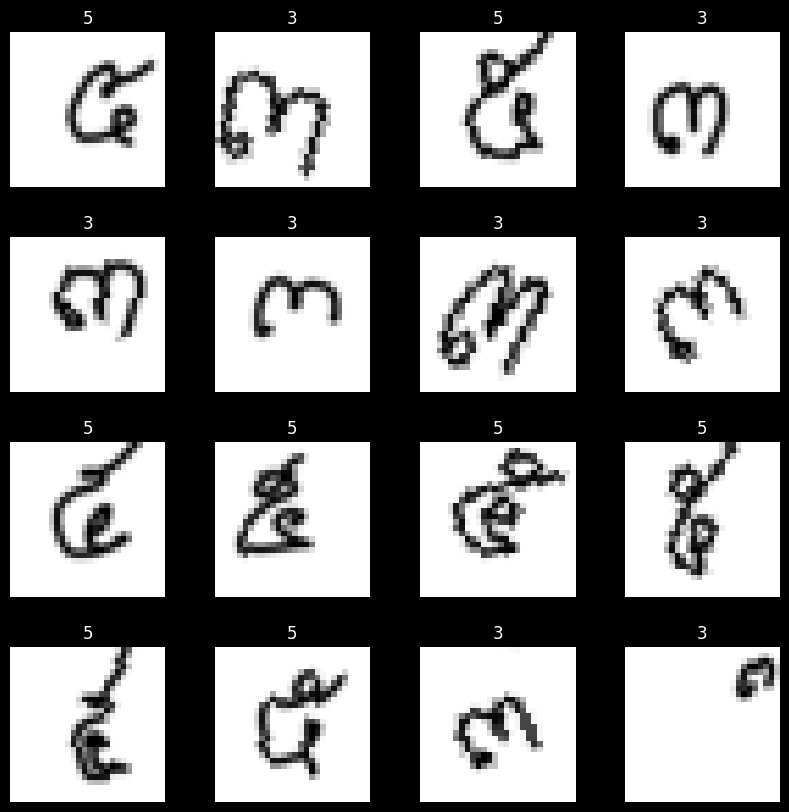

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


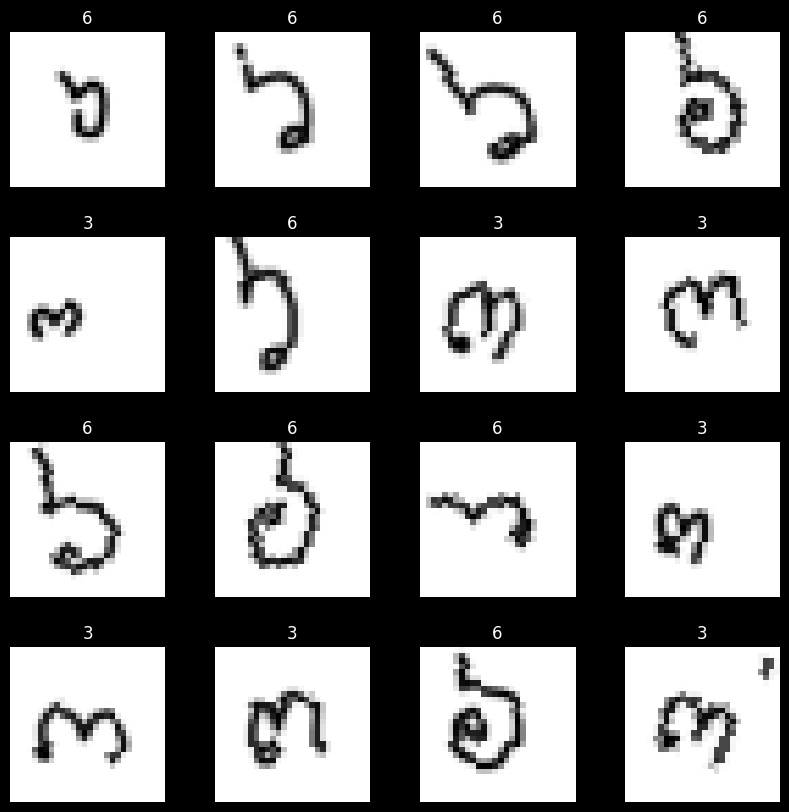

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


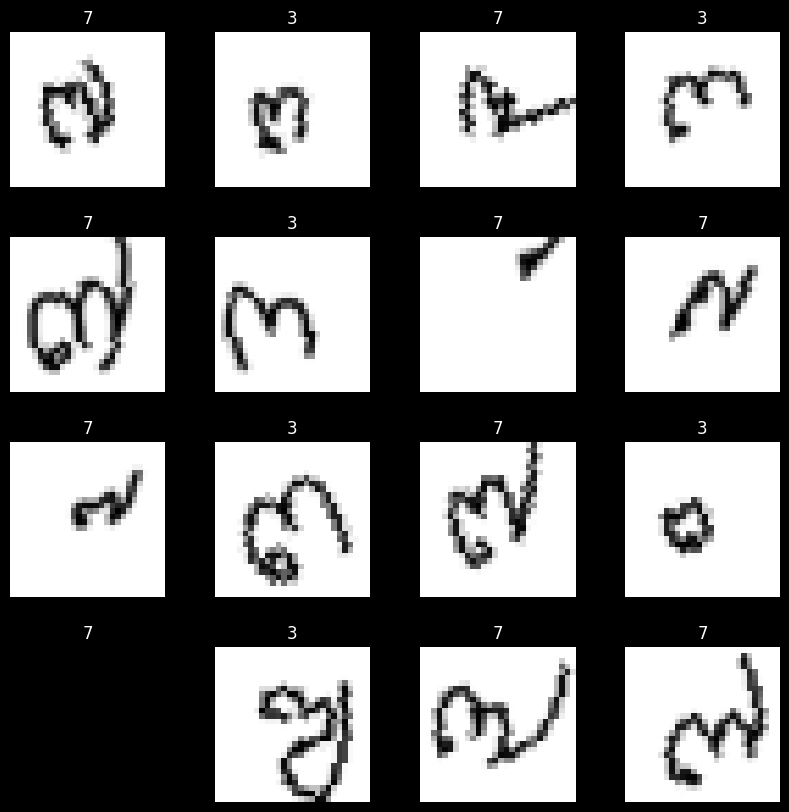

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


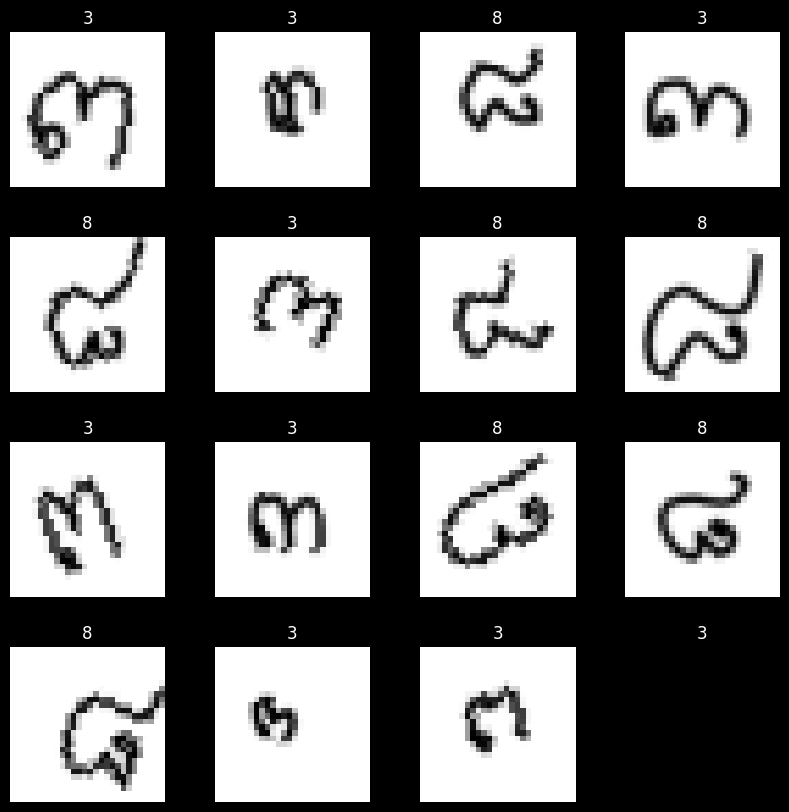

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


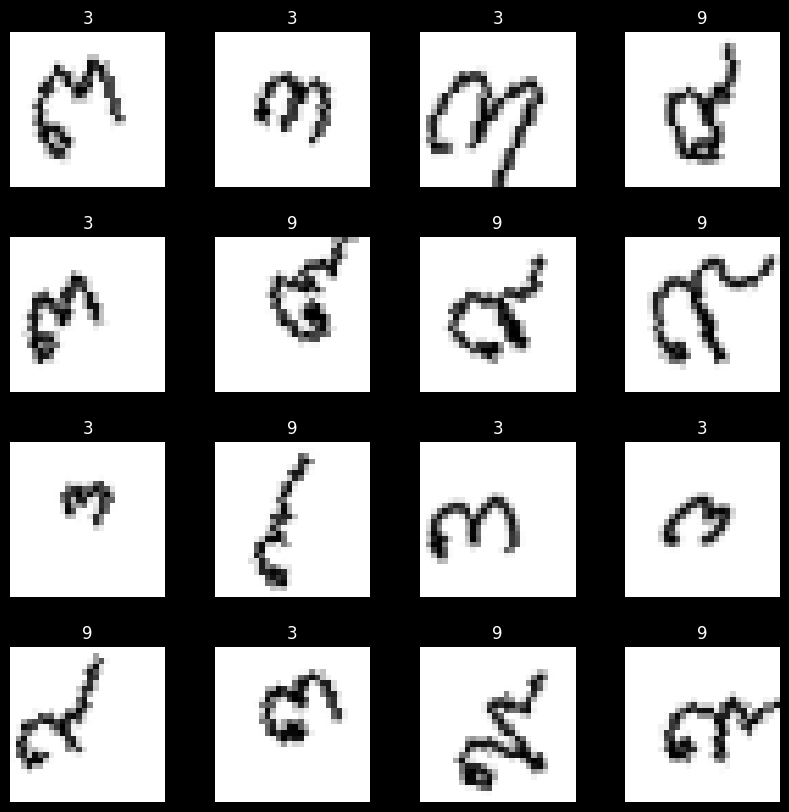

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


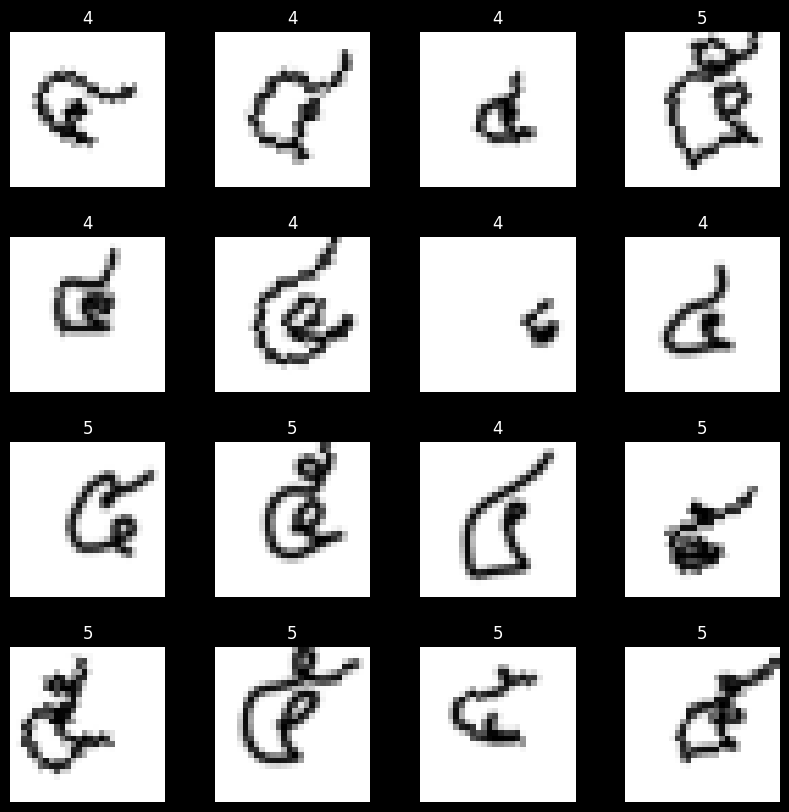

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


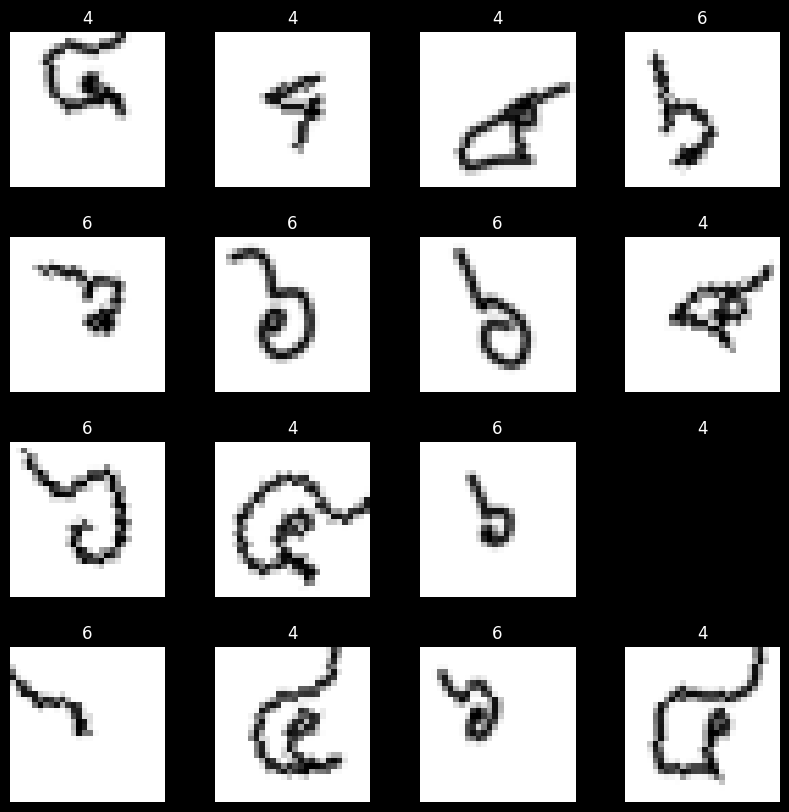

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


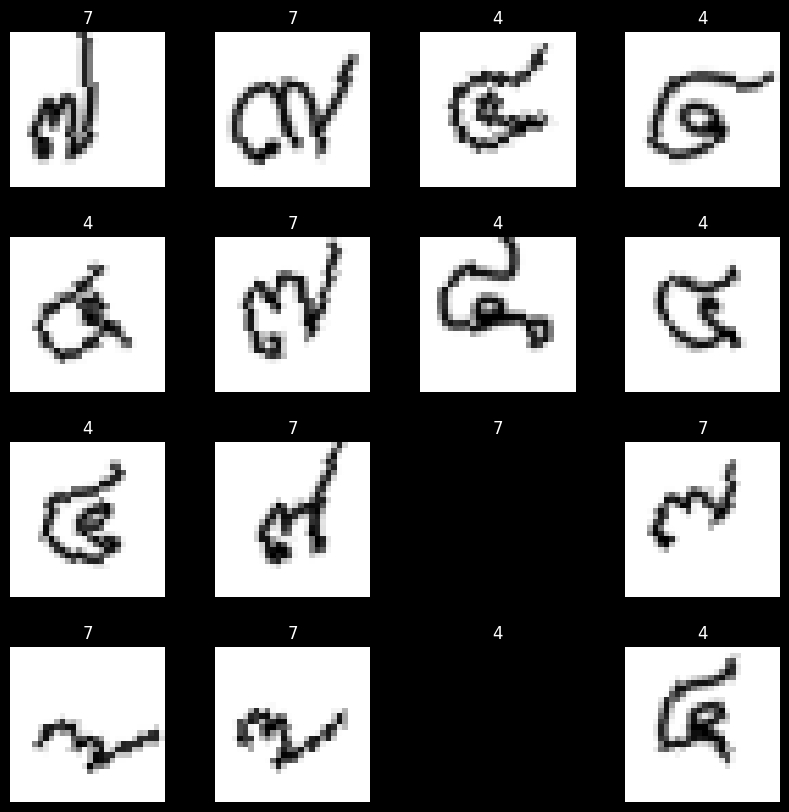

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


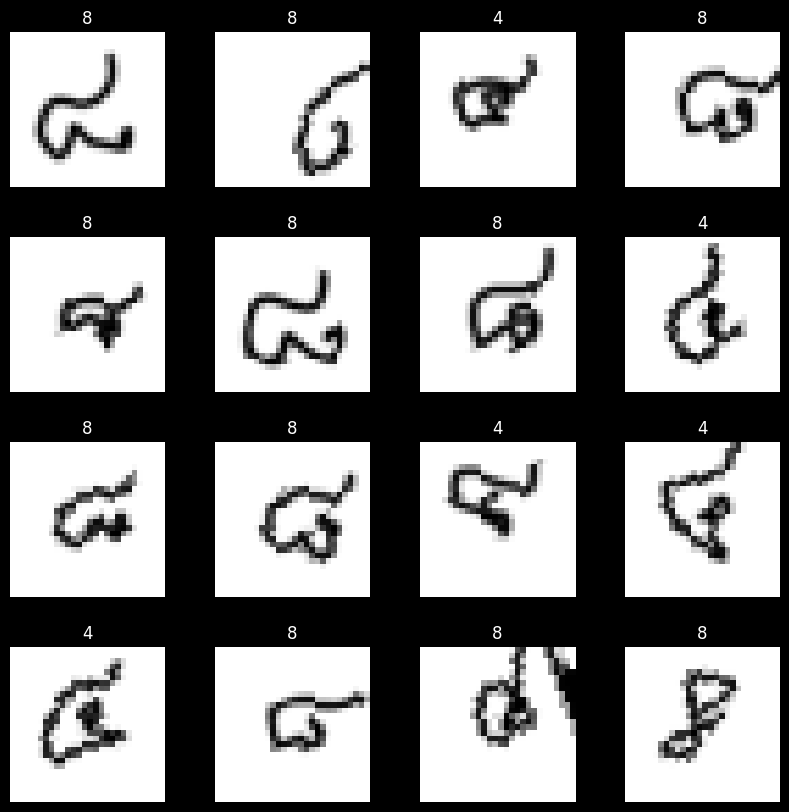

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


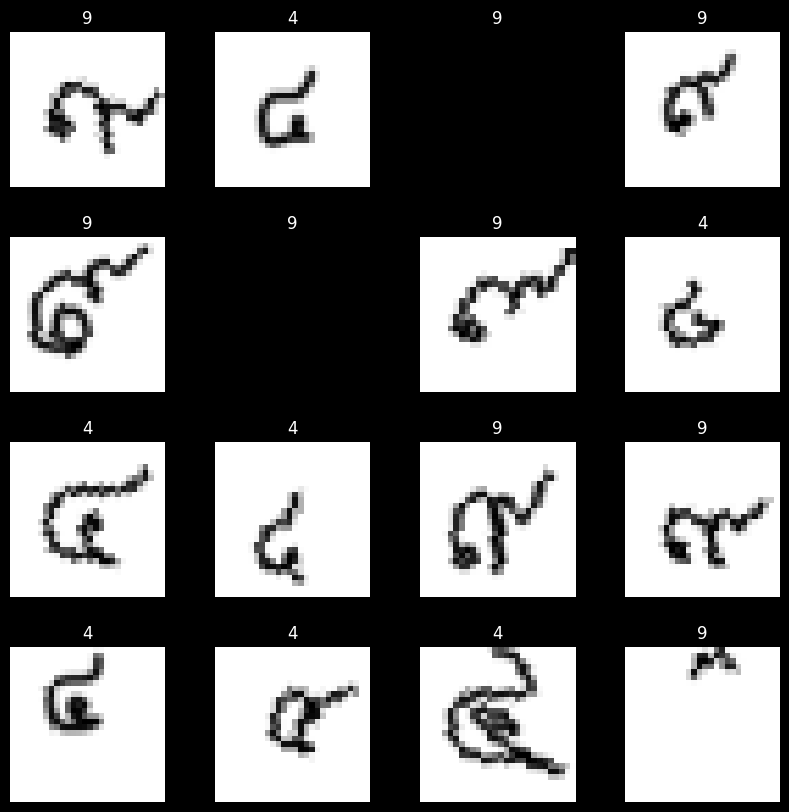

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


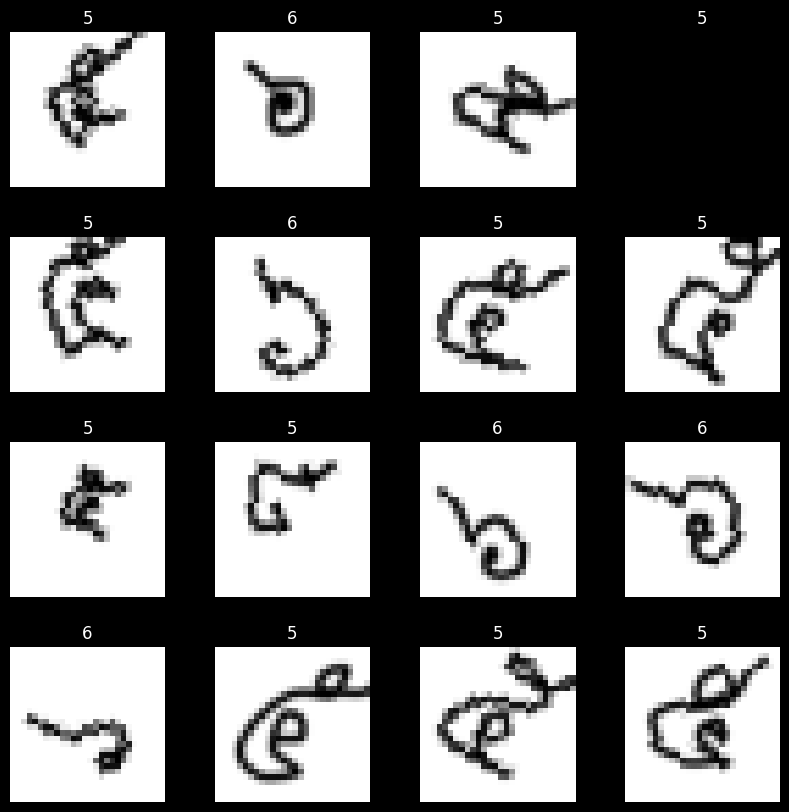

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


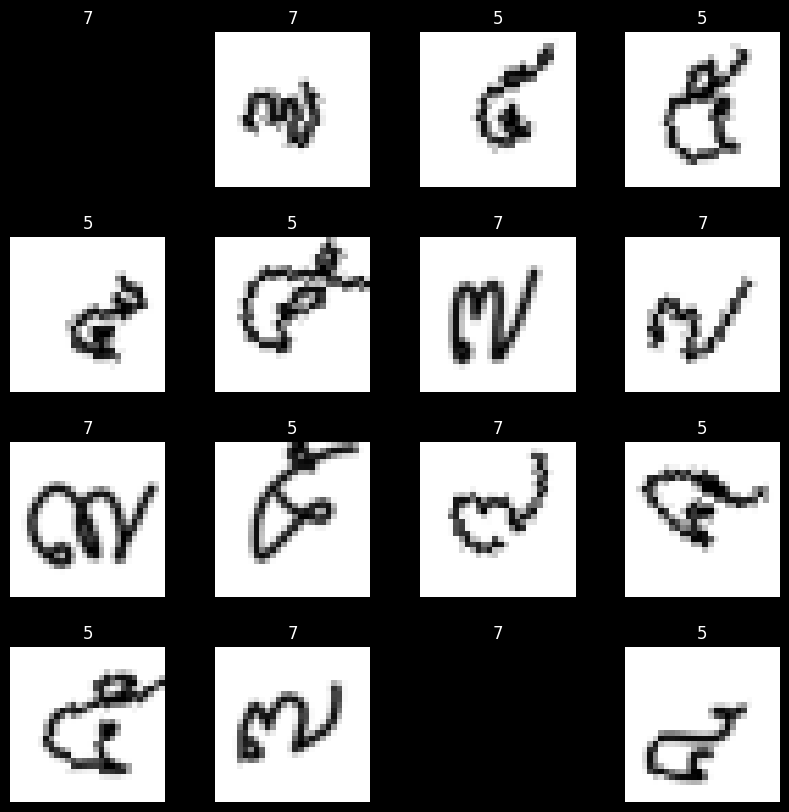

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


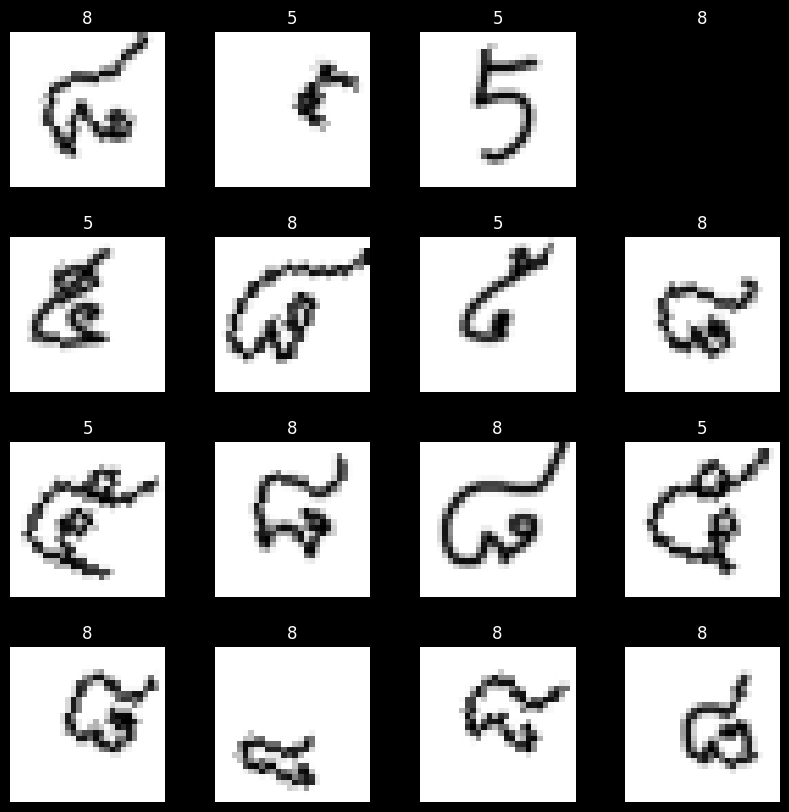

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


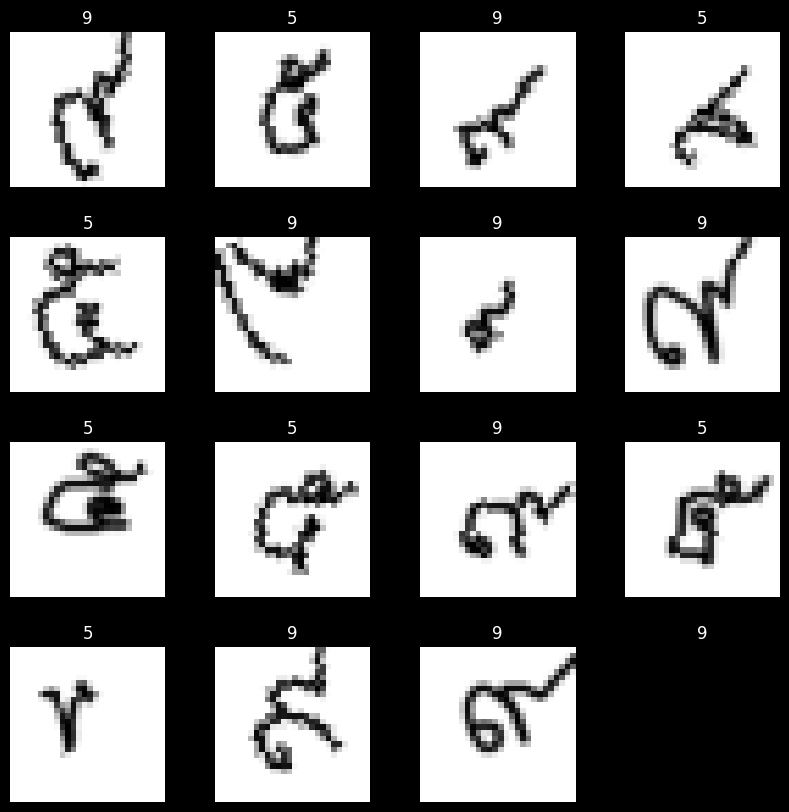

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


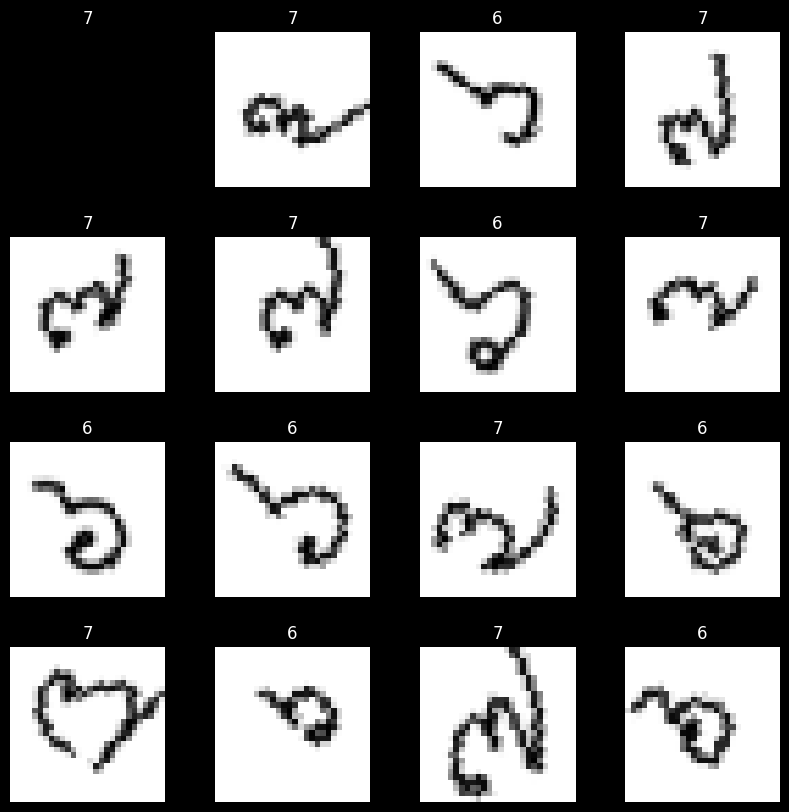

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


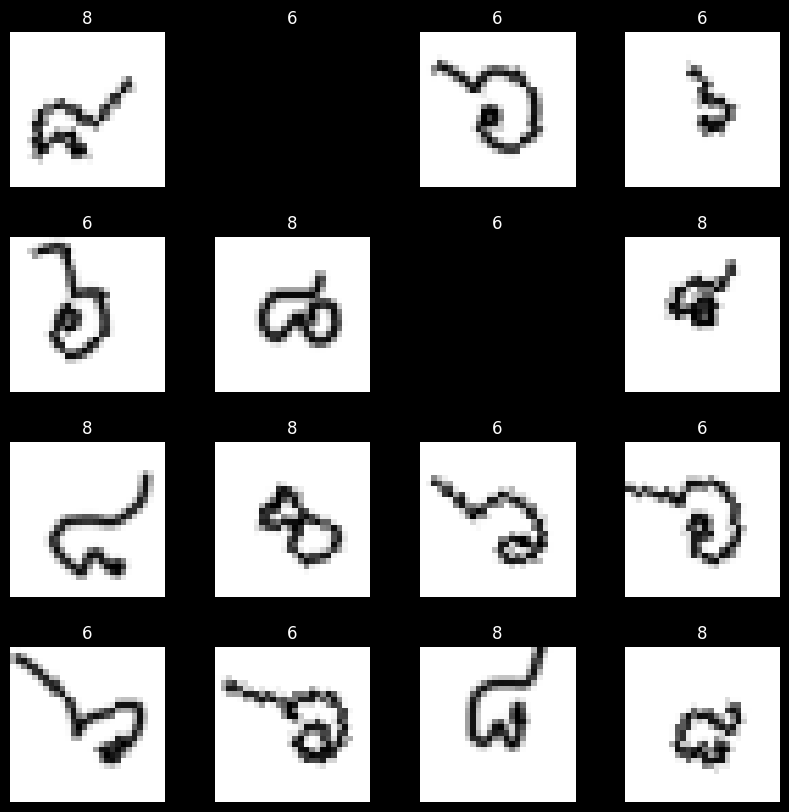

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


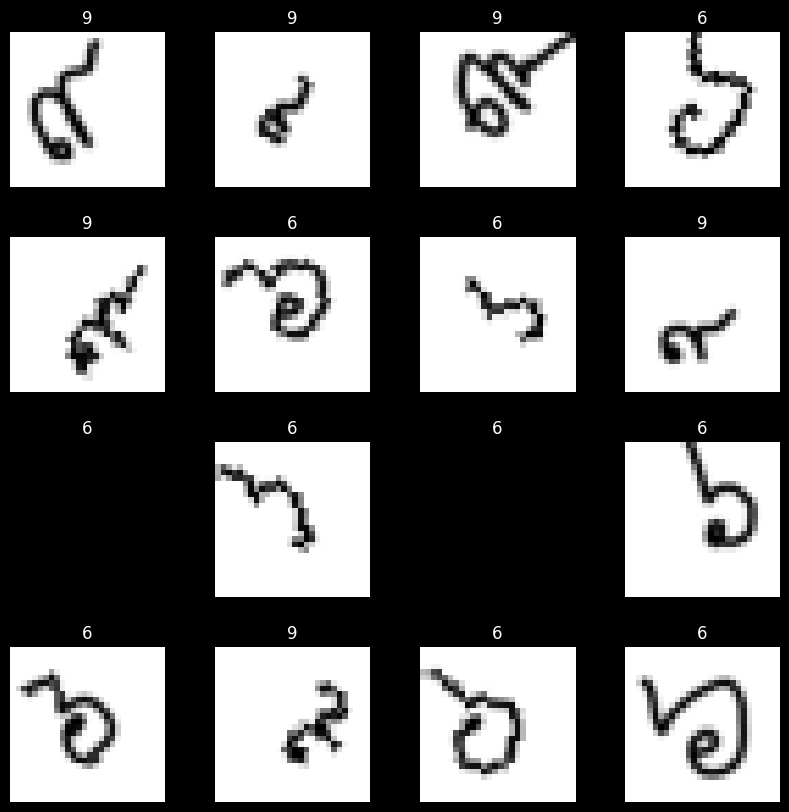

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


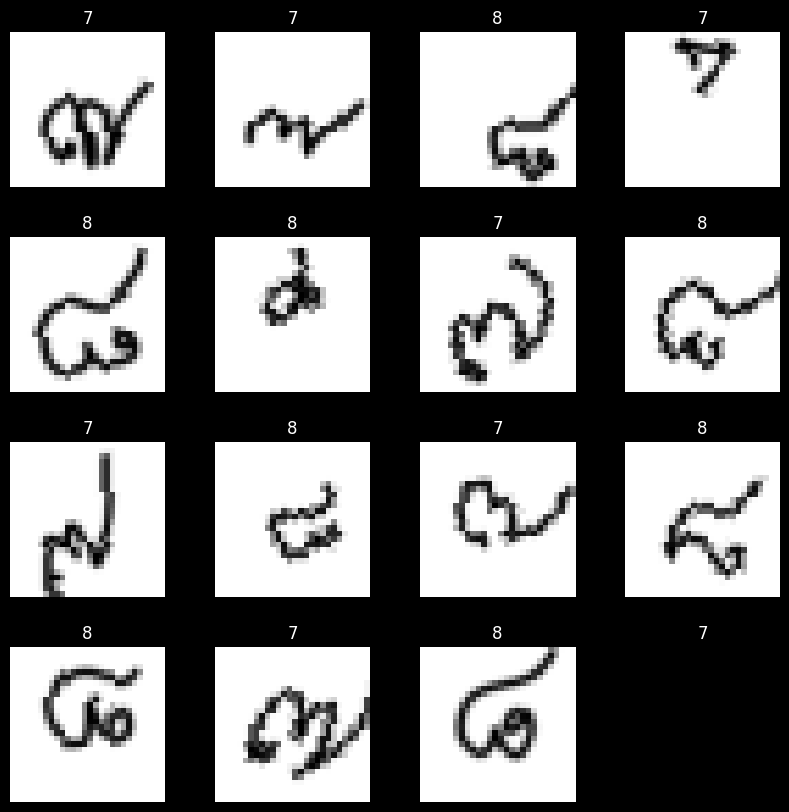

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


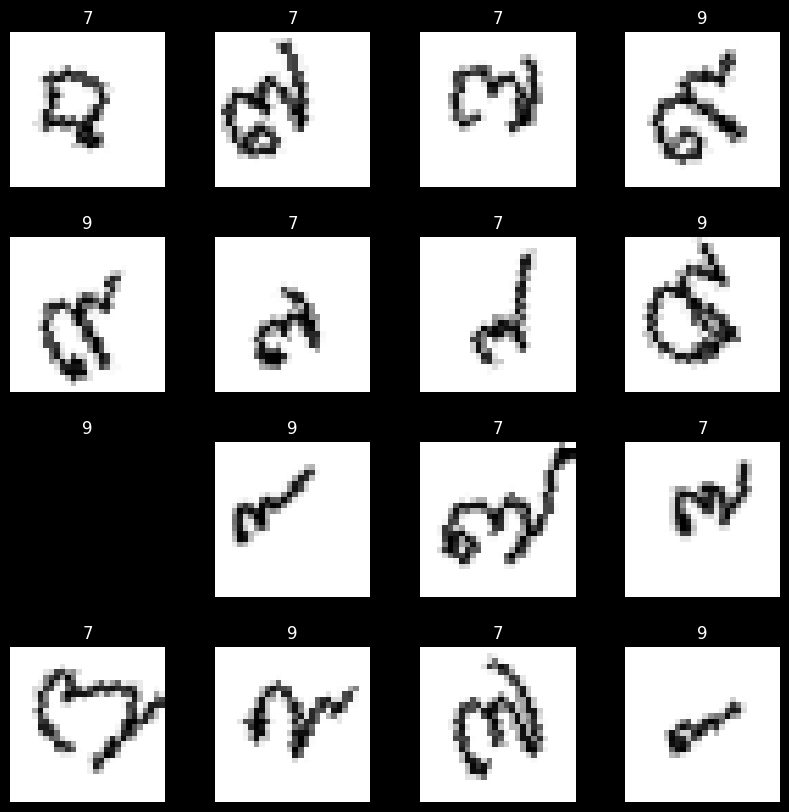

Train Dataset:
	Number of images in class 0: 310
	Number of images in class 1: 310
	Number of train samples: 620
Test Dataset:
	Number of images in class 0: 78
	Number of images in class 1: 78
	Number of test samples: 156


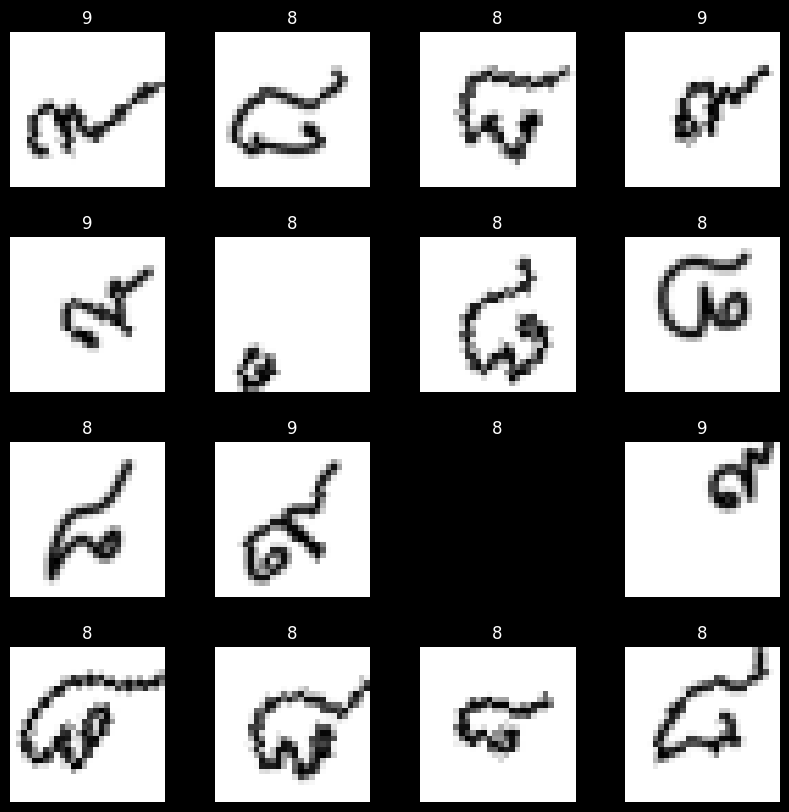

In [30]:
# all class_name and test_loader
combination = []
for i in range(0,10):
      for j in range(1,10):
        if i<j :
            combination.append([str(i),str(j)])
            
cn_and_loader = []
for com in combination:
      class_names = com
      train_loader, test_loader = load_data('./thai-handwriting-number/thai-handwriting-number.appspot.com',class_names)
      cn_and_loader.append((class_names,train_loader,test_loader))

Training Epoch [1/5]:   0%|          | 0/39 [00:00<?, ?batch/s]

Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.21batch/s, loss=0.671]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.35batch/s, loss=0.619]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.62batch/s, loss=0.532]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.83batch/s, loss=0.446]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.59batch/s, loss=0.367]


Epoch 5, Loss: 0.3724, Accuracy: 0.8438, Test Loss: 0.3667, Test Accuracy: 0.8077

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.52batch/s, loss=0.187]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.93batch/s, loss=0.158]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.78batch/s, loss=0.192]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.33batch/s, loss=0.303]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.84batch/s, loss=0.024]


Epoch 5, Loss: 0.1644, Accuracy: 0.9340, Test Loss: 0.2662, Test Accuracy: 0.9359

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.05batch/s, loss=0.122]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.87batch/s, loss=0.131]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.19batch/s, loss=0.451]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.14batch/s, loss=0.194]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.01batch/s, loss=0.104]


Epoch 5, Loss: 0.1812, Accuracy: 0.9226, Test Loss: 0.2875, Test Accuracy: 0.9103

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.11batch/s, loss=0.0878]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.12batch/s, loss=0.0717]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.35batch/s, loss=0.00648]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.99batch/s, loss=0.29] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.25batch/s, loss=0.0527]


Epoch 5, Loss: 0.1021, Accuracy: 0.9484, Test Loss: 0.7443, Test Accuracy: 0.9295

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.71batch/s, loss=0.0304]
C:\Users\USERIT\AppData\Local\Temp\ipykernel_21664\1396517491.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.92batch/s, loss=0.101]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.96batch/s, loss=0.15] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.81batch/s, loss=0.0582]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.64batch/s, loss=0.0616]


Epoch 5, Loss: 0.0811, Accuracy: 0.9581, Test Loss: 0.7382, Test Accuracy: 0.9295

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.18batch/s, loss=0.0592]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.80batch/s, loss=0.468]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.65batch/s, loss=0.114]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.49batch/s, loss=0.107]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.88batch/s, loss=0.55] 


Epoch 5, Loss: 0.1301, Accuracy: 0.9274, Test Loss: 0.8551, Test Accuracy: 0.9167

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.61batch/s, loss=0.163]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.56batch/s, loss=0.0476]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.69batch/s, loss=0.526]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.05batch/s, loss=0.000939]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.77batch/s, loss=0.586]


Epoch 5, Loss: 0.0955, Accuracy: 0.9452, Test Loss: 0.8184, Test Accuracy: 0.9359

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.23batch/s, loss=0.0678]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.51batch/s, loss=0.0526]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.60batch/s, loss=0.607]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.23batch/s, loss=0.922]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.77batch/s, loss=0.0501]


Epoch 5, Loss: 0.0838, Accuracy: 0.9565, Test Loss: 0.8300, Test Accuracy: 0.9167

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.16batch/s, loss=0.023]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.31batch/s, loss=8.7]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.79batch/s, loss=0.019] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.46batch/s, loss=0.0577]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.45batch/s, loss=0.0564]


Epoch 5, Loss: 0.0822, Accuracy: 0.9548, Test Loss: 0.8007, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.11batch/s, loss=0.381]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.44batch/s, loss=0.476]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.08batch/s, loss=0.0864]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.04batch/s, loss=0.175]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.14batch/s, loss=0.0866]


Epoch 5, Loss: 0.1252, Accuracy: 0.9389, Test Loss: 0.1950, Test Accuracy: 0.9167

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.74batch/s, loss=0.186]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.12batch/s, loss=0.222]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.14batch/s, loss=0.312]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.85batch/s, loss=0.0967]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.44batch/s, loss=0.11] 


Epoch 5, Loss: 0.1149, Accuracy: 0.9452, Test Loss: 0.2926, Test Accuracy: 0.9231

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.97batch/s, loss=0.0258]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.89batch/s, loss=0.0628]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.60batch/s, loss=0.154]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.83batch/s, loss=0.0313]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.40batch/s, loss=0.136] 


Epoch 5, Loss: 0.0567, Accuracy: 0.9807, Test Loss: 0.0858, Test Accuracy: 0.9679

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.57batch/s, loss=0.0873] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.43batch/s, loss=0.0156]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.32batch/s, loss=0.225] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.36batch/s, loss=0.00585]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.71batch/s, loss=0.285]  


Epoch 5, Loss: 0.0483, Accuracy: 0.9758, Test Loss: 0.2156, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.35batch/s, loss=0.0373]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.19batch/s, loss=0.034]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.90batch/s, loss=0.0387]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.89batch/s, loss=0.233] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.83batch/s, loss=0.0907]


Epoch 5, Loss: 0.0721, Accuracy: 0.9726, Test Loss: 0.1604, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.89batch/s, loss=0.175]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.98batch/s, loss=0.172] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.56batch/s, loss=0.144]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.90batch/s, loss=0.299] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.89batch/s, loss=0.205]  


Epoch 5, Loss: 0.0595, Accuracy: 0.9807, Test Loss: 0.1810, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.62batch/s, loss=0.436]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.93batch/s, loss=0.00471]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.58batch/s, loss=0.000444]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.14batch/s, loss=0.157] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.38batch/s, loss=0.000191]


Epoch 5, Loss: 0.0363, Accuracy: 0.9871, Test Loss: 0.1634, Test Accuracy: 0.9551

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.13batch/s, loss=0.0377]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.19batch/s, loss=0.0271] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.74batch/s, loss=0.111]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.77batch/s, loss=0.00581]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.64batch/s, loss=0.134] 


Epoch 5, Loss: 0.0482, Accuracy: 0.9839, Test Loss: 0.2028, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.77batch/s, loss=0.405]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.12batch/s, loss=0.179]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.79batch/s, loss=0.034]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.06batch/s, loss=0.053]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.26batch/s, loss=0.0469]


Epoch 5, Loss: 0.1239, Accuracy: 0.9485, Test Loss: 0.2254, Test Accuracy: 0.9103

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.10batch/s, loss=0.194]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.93batch/s, loss=0.124]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.00batch/s, loss=0.318]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.08batch/s, loss=0.0998]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.33batch/s, loss=0.0204]


Epoch 5, Loss: 0.0677, Accuracy: 0.9742, Test Loss: 0.1657, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.08batch/s, loss=0.0362]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.91batch/s, loss=0.0192]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.31batch/s, loss=0.0143]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.77batch/s, loss=0.844] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.21batch/s, loss=0.102]


Epoch 5, Loss: 0.0538, Accuracy: 0.9758, Test Loss: 0.1654, Test Accuracy: 0.9359

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.89batch/s, loss=0.182]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.30batch/s, loss=0.354]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.30batch/s, loss=0.514] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.12batch/s, loss=0.233]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.04batch/s, loss=0.159]


Epoch 5, Loss: 0.0944, Accuracy: 0.9646, Test Loss: 0.1346, Test Accuracy: 0.9423

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.22batch/s, loss=0.331]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.71batch/s, loss=0.0367]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.63batch/s, loss=0.331] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.19batch/s, loss=1.12]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.81batch/s, loss=0.391]


Epoch 5, Loss: 0.0570, Accuracy: 0.9758, Test Loss: 0.2552, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.02batch/s, loss=0.0121]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.33batch/s, loss=0.257]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.58batch/s, loss=0.632]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.09batch/s, loss=0.0172]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.05batch/s, loss=0.199]


Epoch 5, Loss: 0.0491, Accuracy: 0.9823, Test Loss: 0.1163, Test Accuracy: 0.9551

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.19batch/s, loss=0.00545]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.91batch/s, loss=0.197]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.51batch/s, loss=0.0985]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.20batch/s, loss=0.00242]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.70batch/s, loss=0.031] 


Epoch 5, Loss: 0.0403, Accuracy: 0.9823, Test Loss: 0.1328, Test Accuracy: 0.9359

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.12batch/s, loss=0.0493]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.36batch/s, loss=0.00502]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.25batch/s, loss=0.2]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.30batch/s, loss=0.0191]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.47batch/s, loss=0.0139]


Epoch 5, Loss: 0.0881, Accuracy: 0.9548, Test Loss: 0.1018, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.46batch/s, loss=0.0708]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.19batch/s, loss=0.314] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.09batch/s, loss=0.196]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.37batch/s, loss=0.0467]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.07batch/s, loss=0.121]


Epoch 5, Loss: 0.0660, Accuracy: 0.9565, Test Loss: 0.0978, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.69batch/s, loss=0.267]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.83batch/s, loss=0.509]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.00batch/s, loss=0.357]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.33batch/s, loss=0.0179]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.14batch/s, loss=0.0528]


Epoch 5, Loss: 0.0784, Accuracy: 0.9548, Test Loss: 0.1229, Test Accuracy: 0.9295

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.15batch/s, loss=0.378]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.06batch/s, loss=0.2]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.65batch/s, loss=0.0346]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.22batch/s, loss=0.118] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.54batch/s, loss=0.00935]


Epoch 5, Loss: 0.0747, Accuracy: 0.9597, Test Loss: 0.1682, Test Accuracy: 0.9423

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.63batch/s, loss=0.183]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.13batch/s, loss=0.0781]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.28batch/s, loss=0.0506] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.02batch/s, loss=0.0522]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.77batch/s, loss=0.147] 


Epoch 5, Loss: 0.0511, Accuracy: 0.9548, Test Loss: 0.1514, Test Accuracy: 0.9423

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.58batch/s, loss=0.309]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.24batch/s, loss=0.0853]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.91batch/s, loss=0.375]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.92batch/s, loss=0.0163]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.83batch/s, loss=0.0313] 


Epoch 5, Loss: 0.0589, Accuracy: 0.9645, Test Loss: 0.1893, Test Accuracy: 0.9231

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.94batch/s, loss=0.338]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.71batch/s, loss=0.194]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.98batch/s, loss=0.116]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.41batch/s, loss=0.11] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.00batch/s, loss=0.396]


Epoch 5, Loss: 0.1709, Accuracy: 0.9097, Test Loss: 0.2115, Test Accuracy: 0.9038

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 12.03batch/s, loss=0.15] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.61batch/s, loss=0.316]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.56batch/s, loss=0.232] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.92batch/s, loss=0.126]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.27batch/s, loss=0.0472]


Epoch 5, Loss: 0.0999, Accuracy: 0.9435, Test Loss: 0.1136, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.20batch/s, loss=0.151]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.54batch/s, loss=0.87]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.50batch/s, loss=0.0261]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.50batch/s, loss=0.0151]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.90batch/s, loss=0.472]


Epoch 5, Loss: 0.0846, Accuracy: 0.9452, Test Loss: 0.1932, Test Accuracy: 0.9231

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.17batch/s, loss=0.418]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.11batch/s, loss=0.249]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.55batch/s, loss=0.211]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.55batch/s, loss=0.384]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.17batch/s, loss=0.791]


Epoch 5, Loss: 0.2028, Accuracy: 0.9081, Test Loss: 0.3397, Test Accuracy: 0.8526

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.98batch/s, loss=0.0919]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.89batch/s, loss=0.0973]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.86batch/s, loss=0.664]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.85batch/s, loss=0.336]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.39batch/s, loss=0.00238]


Epoch 5, Loss: 0.1046, Accuracy: 0.9371, Test Loss: 0.2795, Test Accuracy: 0.8910

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.07batch/s, loss=0.138]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.79batch/s, loss=0.247]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.82batch/s, loss=0.0522]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.20batch/s, loss=0.0919]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.32batch/s, loss=0.0312]


Epoch 5, Loss: 0.0951, Accuracy: 0.9516, Test Loss: 0.1299, Test Accuracy: 0.9231

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.70batch/s, loss=0.0488]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.01batch/s, loss=0.0154]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.21batch/s, loss=0.235]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.83batch/s, loss=0.134] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.77batch/s, loss=0.27]  


Epoch 5, Loss: 0.0680, Accuracy: 0.9581, Test Loss: 0.1273, Test Accuracy: 0.9423

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.04batch/s, loss=0.0597]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.28batch/s, loss=0.283]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.02batch/s, loss=0.0922]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.98batch/s, loss=0.251]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.28batch/s, loss=0.00378]


Epoch 5, Loss: 0.1082, Accuracy: 0.9468, Test Loss: 0.1442, Test Accuracy: 0.9295

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.55batch/s, loss=0.0225]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.58batch/s, loss=0.27] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.80batch/s, loss=0.202]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.15batch/s, loss=0.141]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.04batch/s, loss=0.000802]


Epoch 5, Loss: 0.0687, Accuracy: 0.9597, Test Loss: 0.1039, Test Accuracy: 0.9487

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.25batch/s, loss=0.552]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.89batch/s, loss=0.249]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.27batch/s, loss=0.233]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.40batch/s, loss=0.0763]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.61batch/s, loss=0.28]  


Epoch 5, Loss: 0.0906, Accuracy: 0.9532, Test Loss: 0.2078, Test Accuracy: 0.9231

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.85batch/s, loss=0.146]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.67batch/s, loss=0.104]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.45batch/s, loss=0.218] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.34batch/s, loss=0.571]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.48batch/s, loss=0.0965]


Epoch 5, Loss: 0.0907, Accuracy: 0.9516, Test Loss: 0.1645, Test Accuracy: 0.9295

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.46batch/s, loss=0.166] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.27batch/s, loss=0.361]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.73batch/s, loss=0.0514]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.69batch/s, loss=0.00491]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.16batch/s, loss=0.123] 


Epoch 5, Loss: 0.0689, Accuracy: 0.9581, Test Loss: 0.1592, Test Accuracy: 0.9423

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.86batch/s, loss=0.0747]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.38batch/s, loss=0.3]  


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.58batch/s, loss=0.416]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.55batch/s, loss=0.274]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.80batch/s, loss=0.0725]


Epoch 5, Loss: 0.1117, Accuracy: 0.9387, Test Loss: 0.1819, Test Accuracy: 0.9167

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.88batch/s, loss=0.643]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.98batch/s, loss=0.199]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.95batch/s, loss=0.0895]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.78batch/s, loss=0.134]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.14batch/s, loss=0.481]


Epoch 5, Loss: 0.1318, Accuracy: 0.9339, Test Loss: 0.2985, Test Accuracy: 0.8718

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.89batch/s, loss=0.59] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.06batch/s, loss=0.116]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.41batch/s, loss=0.159]


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.67batch/s, loss=0.13] 


3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.44batch/s, loss=0.77]


Epoch 5, Loss: 0.1672, Accuracy: 0.9194, Test Loss: 0.4327, Test Accuracy: 0.8462

3 1
3 16
3 16
3 32
3 32
1 1568
1 128
1 1
1 1


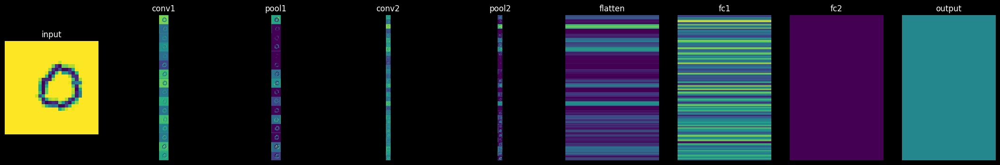

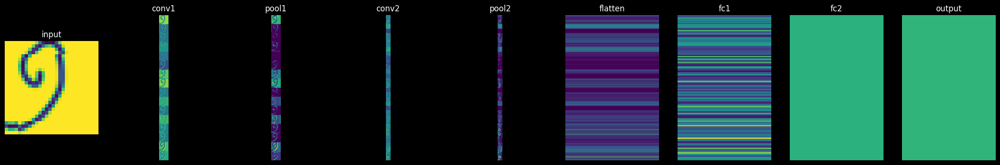

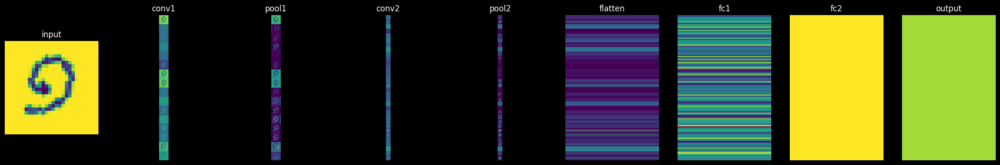

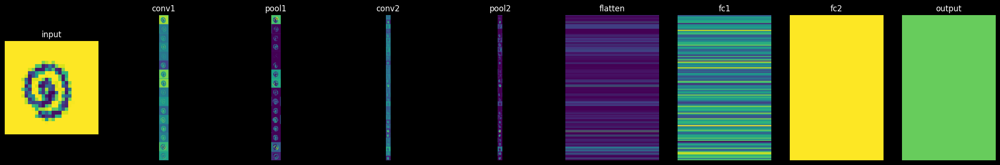

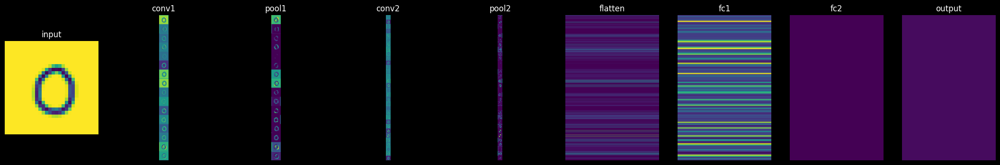

...

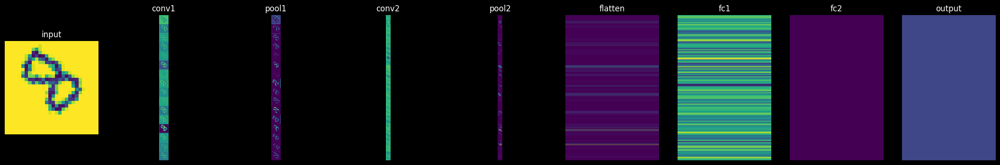

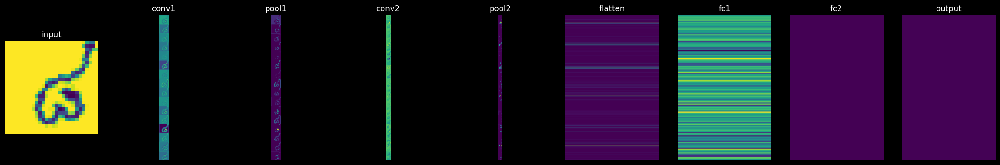

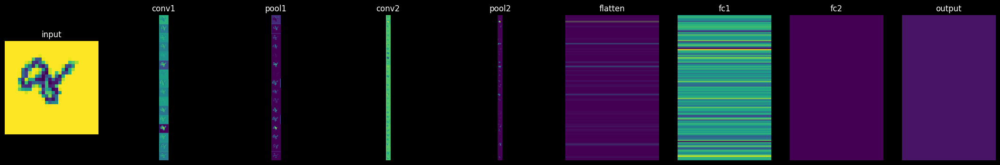

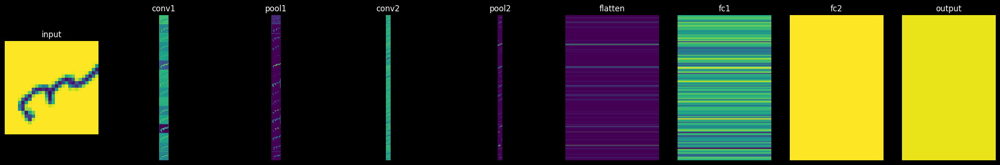

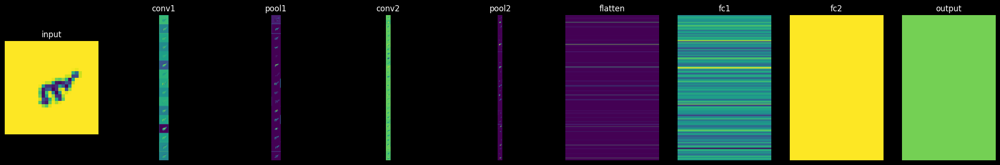

In [31]:
### START CODE HERE ###


cnn_model = CNN() 
loss_fn = nn.BCELoss()
optimizer = torch.optim.SGD(cnn_model.parameters(), lr=0.01, momentum=0.9)

for cl in cn_and_loader:
    class_names,train_loader,test_loader  = cl
    writer = SummaryWriter(log_dir=f'runs/{class_names[0]}_{class_names[1]}/CNN')

    device = 'cpu'

    cnn_history = train(
        class_names,
        cnn_model,
        optimizer,
        loss_fn,
        train_loader,
        test_loader,
        epochs=5,
        writer=writer,
        checkpoint_path=f"checkpoints/cnn_model/{class_names}.pth",
        device=device,
    )

### END CODE HERE ###

Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.90batch/s, loss=0.526]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.019, max=1.992
torch.Size([16, 1])
sigmoid values: min=0.117, max=0.880
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.73batch/s, loss=0.813]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.337, max=-0.202
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.450
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.34batch/s, loss=0.346]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.080, max=2.793
torch.Size([16, 1])
sigmoid values: min=0.044, max=0.942
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.35batch/s, loss=0.278]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.498, max=3.201
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.961
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.29batch/s, loss=0.124]


Epoch 5, Loss: 0.4796, Accuracy: 0.7923, Test Loss: 0.4687, Test Accuracy: 0.7692

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.094, max=3.282
torch.Size([16, 1])
sigmoid values: min=0.016, max=0.964
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.81batch/s, loss=0.355]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.922, max=2.125
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.893
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.50batch/s, loss=0.43]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.567, max=5.951
torch.Size([16, 1])
sigmoid values: min=0.071, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.37batch/s, loss=0.221]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.277, max=4.586
torch.Size([16, 1])
sigmoid values: min=0.014, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.36batch/s, loss=0.481]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.856, max=7.763
torch.Size([16, 1])
sigmoid values: min=0.054, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.84batch/s, loss=0.456]


Epoch 5, Loss: 0.3473, Accuracy: 0.8873, Test Loss: 0.3779, Test Accuracy: 0.8782

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.078, max=5.540
torch.Size([16, 1])
sigmoid values: min=0.017, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.83batch/s, loss=0.595]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.000, max=4.676
torch.Size([16, 1])
sigmoid values: min=0.018, max=0.991
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.54batch/s, loss=1.04]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.255, max=6.132
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.13batch/s, loss=0.606]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.800, max=3.220
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.962
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 42.02batch/s, loss=0.406]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.899, max=2.580
torch.Size([16, 1])
sigmoid values: min=0.007, max=0.930
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.90batch/s, loss=0.358]


Epoch 5, Loss: 0.4777, Accuracy: 0.8242, Test Loss: 0.4698, Test Accuracy: 0.8077

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.239, max=3.143
torch.Size([16, 1])
sigmoid values: min=0.014, max=0.959
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.62batch/s, loss=0.675]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.529, max=4.728
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.991
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.96batch/s, loss=0.724]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.154, max=8.946
torch.Size([16, 1])
sigmoid values: min=0.041, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.72batch/s, loss=0.63]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.193, max=7.685
torch.Size([16, 1])
sigmoid values: min=0.006, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.44batch/s, loss=0.309]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.345, max=12.706
torch.Size([16, 1])
sigmoid values: min=0.013, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.52batch/s, loss=0.602]


Epoch 5, Loss: 0.4000, Accuracy: 0.8661, Test Loss: 0.6476, Test Accuracy: 0.7756

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.165, max=9.592
torch.Size([16, 1])
sigmoid values: min=0.006, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.72batch/s, loss=0.626]
C:\Users\USERIT\AppData\Local\Temp\ipykernel_21664\1396517491.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.558, max=8.024
torch.Size([16, 1])
sigmoid values: min=0.010, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.11batch/s, loss=0.894]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.962, max=5.798
torch.Size([16, 1])
sigmoid values: min=0.007, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.90batch/s, loss=0.499]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.312, max=6.130
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.67batch/s, loss=0.817]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.144, max=6.334
torch.Size([16, 1])
sigmoid values: min=0.016, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.55batch/s, loss=0.0301]


Epoch 5, Loss: 0.3689, Accuracy: 0.8629, Test Loss: 0.4590, Test Accuracy: 0.8590

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.642, max=6.526
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.89batch/s, loss=0.574]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.895, max=1.995
torch.Size([16, 1])
sigmoid values: min=0.131, max=0.880
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.49batch/s, loss=0.48]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.896, max=4.751
torch.Size([16, 1])
sigmoid values: min=0.052, max=0.991
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.17batch/s, loss=1.13]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.121, max=7.599
torch.Size([16, 1])
sigmoid values: min=0.246, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.30batch/s, loss=0.537]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.944, max=4.472
torch.Size([16, 1])
sigmoid values: min=0.019, max=0.989
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.76batch/s, loss=0.388]


Epoch 5, Loss: 0.5020, Accuracy: 0.7919, Test Loss: 0.3880, Test Accuracy: 0.8333

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.481, max=3.884
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.980
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.06batch/s, loss=0.208]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.575, max=4.926
torch.Size([16, 1])
sigmoid values: min=0.010, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.09batch/s, loss=0.471]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.328, max=3.677
torch.Size([16, 1])
sigmoid values: min=0.013, max=0.975
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.78batch/s, loss=0.186]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.984, max=6.471
torch.Size([16, 1])
sigmoid values: min=0.048, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.19batch/s, loss=0.423]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.056, max=5.610
torch.Size([16, 1])
sigmoid values: min=0.045, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.31batch/s, loss=0.494]


Epoch 5, Loss: 0.4108, Accuracy: 0.8339, Test Loss: 0.3659, Test Accuracy: 0.8846

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.977, max=4.821
torch.Size([16, 1])
sigmoid values: min=0.018, max=0.992
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.62batch/s, loss=0.685]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.256, max=6.832
torch.Size([16, 1])
sigmoid values: min=0.037, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.08batch/s, loss=0.41]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.501, max=3.377
torch.Size([16, 1])
sigmoid values: min=0.029, max=0.967
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.45batch/s, loss=0.307]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.618, max=6.045
torch.Size([16, 1])
sigmoid values: min=0.166, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.56batch/s, loss=0.685]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.466, max=5.612
torch.Size([16, 1])
sigmoid values: min=0.188, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.75batch/s, loss=0.65]


Epoch 5, Loss: 0.5732, Accuracy: 0.7710, Test Loss: 0.5107, Test Accuracy: 0.7949

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.006, max=6.534
torch.Size([16, 1])
sigmoid values: min=0.047, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.56batch/s, loss=0.105]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.424, max=4.578
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.88batch/s, loss=0.828]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.622, max=8.379
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.45batch/s, loss=0.388]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.729, max=5.955
torch.Size([16, 1])
sigmoid values: min=0.009, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.25batch/s, loss=0.438]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.522, max=5.589
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.83batch/s, loss=0.32]


Epoch 5, Loss: 0.3927, Accuracy: 0.8371, Test Loss: 0.3593, Test Accuracy: 0.8590

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.942, max=9.907
torch.Size([16, 1])
sigmoid values: min=0.007, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.74batch/s, loss=0.897]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.413, max=14.258
torch.Size([16, 1])
sigmoid values: min=0.196, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.04batch/s, loss=2.06]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.475, max=5.886
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.80batch/s, loss=0.238]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.724, max=4.828
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.992
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.12batch/s, loss=0.709]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.247, max=3.174
torch.Size([16, 1])
sigmoid values: min=0.014, max=0.960
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.37batch/s, loss=0.544]


Epoch 5, Loss: 0.5543, Accuracy: 0.7749, Test Loss: 1.1016, Test Accuracy: 0.6474

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.276, max=7.101
torch.Size([16, 1])
sigmoid values: min=0.218, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.28batch/s, loss=0.206]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.052, max=8.339
torch.Size([16, 1])
sigmoid values: min=0.045, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.87batch/s, loss=0.985]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.455, max=3.727
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.976
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.08batch/s, loss=1.75]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.271, max=9.413
torch.Size([16, 1])
sigmoid values: min=0.014, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.68batch/s, loss=0.185]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.185, max=5.021
torch.Size([16, 1])
sigmoid values: min=0.015, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.80batch/s, loss=0.453]


Epoch 5, Loss: 0.4426, Accuracy: 0.8148, Test Loss: 0.6438, Test Accuracy: 0.7436

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.093, max=3.337
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.966
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.18batch/s, loss=0.306]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.790, max=3.980
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.982
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.74batch/s, loss=0.559]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-1.486, max=8.642
torch.Size([16, 1])
sigmoid values: min=0.185, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.42batch/s, loss=0.831]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.822, max=5.079
torch.Size([16, 1])
sigmoid values: min=0.008, max=0.994
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.97batch/s, loss=0.62]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.676, max=5.361
torch.Size([16, 1])
sigmoid values: min=0.064, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.27batch/s, loss=0.901]


Epoch 5, Loss: 0.5005, Accuracy: 0.7794, Test Loss: 1.1816, Test Accuracy: 0.6346

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.606, max=7.532
torch.Size([16, 1])
sigmoid values: min=0.069, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.91batch/s, loss=0.401]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.842, max=4.757
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.991
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.32batch/s, loss=0.562]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.759, max=11.130
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.44batch/s, loss=0.444]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.234, max=10.948
torch.Size([16, 1])
sigmoid values: min=0.014, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.82batch/s, loss=0.946]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.540, max=11.417
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.80batch/s, loss=0.77]


Epoch 5, Loss: 0.3880, Accuracy: 0.8567, Test Loss: 0.5248, Test Accuracy: 0.7821

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.604, max=7.000
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.63batch/s, loss=0.641]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.989, max=6.948
torch.Size([16, 1])
sigmoid values: min=0.018, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.26batch/s, loss=0.513]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.576, max=4.787
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.992
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.21batch/s, loss=1.06]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.054, max=5.332
torch.Size([16, 1])
sigmoid values: min=0.006, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.86batch/s, loss=0.32]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.835, max=5.832
torch.Size([16, 1])
sigmoid values: min=0.008, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.20batch/s, loss=0.616]


Epoch 5, Loss: 0.4996, Accuracy: 0.8164, Test Loss: 0.5859, Test Accuracy: 0.7179

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.225, max=0.877
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.706
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.89batch/s, loss=0.142]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.477, max=4.970
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.66batch/s, loss=0.387]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.363, max=3.474
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.970
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.20batch/s, loss=0.166]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.775, max=6.786
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.49batch/s, loss=0.221]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.561, max=7.024
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.01batch/s, loss=0.844]


Epoch 5, Loss: 0.3630, Accuracy: 0.8502, Test Loss: 0.7250, Test Accuracy: 0.7500

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.382, max=4.985
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.07batch/s, loss=0.41]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.403, max=8.429
torch.Size([16, 1])
sigmoid values: min=0.004, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.51batch/s, loss=0.293]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.828, max=4.442
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.988
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.01batch/s, loss=0.374]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.142, max=12.444
torch.Size([16, 1])
sigmoid values: min=0.016, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.45batch/s, loss=0.18]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.841, max=7.009
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.22batch/s, loss=0.366]


Epoch 5, Loss: 0.3707, Accuracy: 0.8470, Test Loss: 0.3721, Test Accuracy: 0.8397

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.212, max=6.461
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.87batch/s, loss=0.533]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.081, max=8.660
torch.Size([16, 1])
sigmoid values: min=0.111, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.69batch/s, loss=0.462]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.964, max=4.920
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.42batch/s, loss=0.503]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.817, max=10.216
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.15batch/s, loss=0.869]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.614, max=7.550
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.54batch/s, loss=0.549]


Epoch 5, Loss: 0.3444, Accuracy: 0.8615, Test Loss: 0.4646, Test Accuracy: 0.8397

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.041, max=6.413
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.78batch/s, loss=0.829]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.715, max=5.489
torch.Size([16, 1])
sigmoid values: min=0.009, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.98batch/s, loss=0.35]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.115, max=5.028
torch.Size([16, 1])
sigmoid values: min=0.042, max=0.993
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.48batch/s, loss=0.525]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.053, max=2.169
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.897
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.48batch/s, loss=1.17]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.033, max=6.985
torch.Size([16, 1])
sigmoid values: min=0.017, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.47batch/s, loss=0.866]


Epoch 5, Loss: 0.4186, Accuracy: 0.8213, Test Loss: 0.7115, Test Accuracy: 0.7628

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.518, max=8.137
torch.Size([16, 1])
sigmoid values: min=0.029, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.77batch/s, loss=0.0413]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.678, max=5.835
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.28batch/s, loss=0.576]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.632, max=6.309
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.76batch/s, loss=0.631]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.481, max=6.359
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.28batch/s, loss=0.379]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.217, max=4.627
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.83batch/s, loss=0.757]


Epoch 5, Loss: 0.4324, Accuracy: 0.8309, Test Loss: 0.4462, Test Accuracy: 0.8462

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.520, max=4.555
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.30batch/s, loss=0.00512]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.423, max=6.978
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.91batch/s, loss=0.22] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.198, max=11.059
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.29batch/s, loss=1.18]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.247, max=15.748
torch.Size([16, 1])
sigmoid values: min=0.037, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.09batch/s, loss=0.0918]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.358, max=13.897
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.05batch/s, loss=0.344]


Epoch 5, Loss: 0.3153, Accuracy: 0.8728, Test Loss: 0.3483, Test Accuracy: 0.8333

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.791, max=11.489
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.69batch/s, loss=0.598]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.282, max=5.305
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.32batch/s, loss=0.241]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-0.646, max=11.540
torch.Size([16, 1])
sigmoid values: min=0.344, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.91batch/s, loss=1.05]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.394, max=4.468
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.989
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.18batch/s, loss=0.455]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.591, max=2.117
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.893
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.24batch/s, loss=0.407]


Epoch 5, Loss: 0.4488, Accuracy: 0.8357, Test Loss: 0.6146, Test Accuracy: 0.8013

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.160, max=9.818
torch.Size([16, 1])
sigmoid values: min=0.103, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.23batch/s, loss=1.68]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.910, max=1.060
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.743
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.06batch/s, loss=0.737]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.584, max=6.532
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.63batch/s, loss=0.156]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.935, max=11.715
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.21batch/s, loss=0.883]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.838, max=7.951
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.59batch/s, loss=0.33] 


Epoch 5, Loss: 0.2627, Accuracy: 0.8792, Test Loss: 0.4382, Test Accuracy: 0.8654

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.762, max=10.459
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.48batch/s, loss=0.683]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.000, max=4.427
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.988
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.55batch/s, loss=0.191]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.997, max=4.045
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.983
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.29batch/s, loss=0.216]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-13.955, max=7.555
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.78batch/s, loss=0.161]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.011, max=7.531
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.27batch/s, loss=0.17]


Epoch 5, Loss: 0.2632, Accuracy: 0.9066, Test Loss: 0.2952, Test Accuracy: 0.8846

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.068, max=3.992
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.982
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.51batch/s, loss=0.339]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.262, max=6.718
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.42batch/s, loss=0.247]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.625, max=7.862
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.72batch/s, loss=0.328]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.382, max=7.053
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.00batch/s, loss=0.291]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.347, max=7.144
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.33batch/s, loss=0.751]


Epoch 5, Loss: 0.2763, Accuracy: 0.8986, Test Loss: 0.3750, Test Accuracy: 0.8974

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.618, max=10.508
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.39batch/s, loss=1.63]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.353, max=7.208
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.49batch/s, loss=1.24]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.676, max=8.240
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.98batch/s, loss=1.01]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.903, max=9.212
torch.Size([16, 1])
sigmoid values: min=0.003, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.98batch/s, loss=0.215]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.051, max=7.391
torch.Size([16, 1])
sigmoid values: min=0.017, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.84batch/s, loss=0.4] 


Epoch 5, Loss: 0.4249, Accuracy: 0.8161, Test Loss: 0.5310, Test Accuracy: 0.8269

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.718, max=10.932
torch.Size([16, 1])
sigmoid values: min=0.062, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.10batch/s, loss=0.348]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.876, max=14.433
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.18batch/s, loss=0.0281]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.713, max=19.795
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.06batch/s, loss=0.0862]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.386, max=12.230
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.97batch/s, loss=0.159]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.108, max=7.692
torch.Size([16, 1])
sigmoid values: min=0.001, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.45batch/s, loss=0.0387]


Epoch 5, Loss: 0.3536, Accuracy: 0.8645, Test Loss: 0.2829, Test Accuracy: 0.8974

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.671, max=14.324
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.49batch/s, loss=0.347]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.588, max=6.767
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.97batch/s, loss=0.378]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.166, max=8.974
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.96batch/s, loss=0.249]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.113, max=13.548
torch.Size([16, 1])
sigmoid values: min=0.016, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.41batch/s, loss=0.228]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.729, max=12.834
torch.Size([16, 1])
sigmoid values: min=0.009, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.06batch/s, loss=0.0572]


Epoch 5, Loss: 0.4264, Accuracy: 0.8516, Test Loss: 0.3438, Test Accuracy: 0.8590

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.878, max=3.311
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.965
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.12batch/s, loss=0.856]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.749, max=6.362
torch.Size([16, 1])
sigmoid values: min=0.060, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.18batch/s, loss=1.01]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.721, max=5.289
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.19batch/s, loss=0.816]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.221, max=5.313
torch.Size([16, 1])
sigmoid values: min=0.014, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.52batch/s, loss=0.403]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.763, max=10.471
torch.Size([16, 1])
sigmoid values: min=0.023, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.21batch/s, loss=0.832]


Epoch 5, Loss: 0.5094, Accuracy: 0.7855, Test Loss: 0.5374, Test Accuracy: 0.8141

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.185, max=4.883
torch.Size([16, 1])
sigmoid values: min=0.040, max=0.992
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.66batch/s, loss=0.184]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.345, max=8.523
torch.Size([16, 1])
sigmoid values: min=0.005, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.69batch/s, loss=0.206]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.797, max=5.659
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.59batch/s, loss=0.366]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.534, max=9.463
torch.Size([16, 1])
sigmoid values: min=0.028, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.77batch/s, loss=0.604]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.799, max=7.321
torch.Size([16, 1])
sigmoid values: min=0.022, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.83batch/s, loss=0.463]


Epoch 5, Loss: 0.4441, Accuracy: 0.8242, Test Loss: 0.4016, Test Accuracy: 0.8013

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.875, max=3.915
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.980
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.94batch/s, loss=0.923]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.522, max=5.988
torch.Size([16, 1])
sigmoid values: min=0.074, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.95batch/s, loss=0.834]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.456, max=6.661
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.97batch/s, loss=0.624]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.334, max=5.974
torch.Size([16, 1])
sigmoid values: min=0.013, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.77batch/s, loss=0.263]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.328, max=5.808
torch.Size([16, 1])
sigmoid values: min=0.013, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.48batch/s, loss=0.263]


Epoch 5, Loss: 0.4017, Accuracy: 0.8210, Test Loss: 0.4341, Test Accuracy: 0.7885

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.378, max=3.116
torch.Size([16, 1])
sigmoid values: min=0.012, max=0.958
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.76batch/s, loss=0.861]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.803, max=14.296
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.91batch/s, loss=0.575]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.449, max=8.642
torch.Size([16, 1])
sigmoid values: min=0.031, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.66batch/s, loss=0.851]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.248, max=12.115
torch.Size([16, 1])
sigmoid values: min=0.037, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.98batch/s, loss=0.28]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.148, max=7.458
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.13batch/s, loss=1.04]


Epoch 5, Loss: 0.6017, Accuracy: 0.7452, Test Loss: 0.6051, Test Accuracy: 0.7436

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.793, max=9.052
torch.Size([16, 1])
sigmoid values: min=0.008, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.18batch/s, loss=1.1] 


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.075, max=2.231
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.903
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.47batch/s, loss=0.445]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.476, max=7.297
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.45batch/s, loss=0.671]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.968, max=4.196
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.985
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.96batch/s, loss=0.673]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.707, max=3.740
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.977
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.16batch/s, loss=0.292]


Epoch 5, Loss: 0.4237, Accuracy: 0.8113, Test Loss: 0.4262, Test Accuracy: 0.8269

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.676, max=4.264
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.986
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.45batch/s, loss=0.601]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.955, max=6.844
torch.Size([16, 1])
sigmoid values: min=0.007, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.33batch/s, loss=0.212]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.878, max=7.061
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.45batch/s, loss=1.15]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.655, max=5.862
torch.Size([16, 1])
sigmoid values: min=0.009, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.04batch/s, loss=0.313]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-12.582, max=6.924
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.87batch/s, loss=1.17]


Epoch 5, Loss: 0.6044, Accuracy: 0.7823, Test Loss: 1.0660, Test Accuracy: 0.7115

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.308, max=10.462
torch.Size([16, 1])
sigmoid values: min=0.035, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.71batch/s, loss=0.705]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.493, max=6.706
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.11batch/s, loss=1.29]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.504, max=6.914
torch.Size([16, 1])
sigmoid values: min=0.029, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.76batch/s, loss=1.24]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.954, max=0.594
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.644
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.01batch/s, loss=0.688]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.987, max=3.108
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.957
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.23batch/s, loss=0.42]


Epoch 5, Loss: 0.6382, Accuracy: 0.7452, Test Loss: 0.6801, Test Accuracy: 0.7051

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.892, max=5.551
torch.Size([16, 1])
sigmoid values: min=0.007, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.96batch/s, loss=0.374]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.693, max=7.839
torch.Size([16, 1])
sigmoid values: min=0.024, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.27batch/s, loss=0.383]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.336, max=5.580
torch.Size([16, 1])
sigmoid values: min=0.034, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.68batch/s, loss=0.758]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-0.758, max=8.031
torch.Size([16, 1])
sigmoid values: min=0.319, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.53batch/s, loss=0.595]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.531, max=2.317
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.910
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.30batch/s, loss=0.54]


Epoch 5, Loss: 0.5038, Accuracy: 0.7710, Test Loss: 0.5277, Test Accuracy: 0.8205

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.810, max=5.694
torch.Size([16, 1])
sigmoid values: min=0.008, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.50batch/s, loss=0.115]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.255, max=5.953
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.13batch/s, loss=0.497]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.356, max=5.065
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.994
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.92batch/s, loss=0.871]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.121, max=7.246
torch.Size([16, 1])
sigmoid values: min=0.016, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.03batch/s, loss=0.375]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.252, max=3.337
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.966
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.44batch/s, loss=0.189]


Epoch 5, Loss: 0.3466, Accuracy: 0.8419, Test Loss: 0.3475, Test Accuracy: 0.8654

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.417, max=4.539
torch.Size([16, 1])
sigmoid values: min=0.012, max=0.989
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.40batch/s, loss=0.131]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.154, max=5.522
torch.Size([16, 1])
sigmoid values: min=0.104, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.68batch/s, loss=0.67]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.455, max=4.374
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.988
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.96batch/s, loss=0.257]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.242, max=6.614
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.65batch/s, loss=0.907]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-11.381, max=9.632
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.27batch/s, loss=0.353]


Epoch 5, Loss: 0.3724, Accuracy: 0.8597, Test Loss: 0.6480, Test Accuracy: 0.7821

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-15.537, max=3.599
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.973
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.30batch/s, loss=0.606]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.823, max=7.302
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.24batch/s, loss=0.431]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-9.861, max=4.188
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.985
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.68batch/s, loss=0.342]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.522, max=6.336
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.55batch/s, loss=0.436]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.468, max=5.373
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.16batch/s, loss=1.45]


Epoch 5, Loss: 0.5743, Accuracy: 0.7726, Test Loss: 0.7952, Test Accuracy: 0.7628

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.271, max=9.719
torch.Size([16, 1])
sigmoid values: min=0.037, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.96batch/s, loss=0.784]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.652, max=7.605
torch.Size([16, 1])
sigmoid values: min=0.009, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.61batch/s, loss=0.571]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.980, max=2.238
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.904
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.04batch/s, loss=0.435]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.277, max=3.117
torch.Size([16, 1])
sigmoid values: min=0.093, max=0.958
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.91batch/s, loss=0.603]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.360, max=2.807
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.943
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.69batch/s, loss=0.254]


Epoch 5, Loss: 0.5486, Accuracy: 0.7726, Test Loss: 0.4974, Test Accuracy: 0.7949

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.261, max=3.096
torch.Size([16, 1])
sigmoid values: min=0.014, max=0.957
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.41batch/s, loss=0.412]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.907, max=6.719
torch.Size([16, 1])
sigmoid values: min=0.020, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.54batch/s, loss=0.573]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.282, max=4.288
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.986
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.07batch/s, loss=0.132]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.191, max=5.032
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.994
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.05batch/s, loss=0.367]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.437, max=13.384
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.67batch/s, loss=0.231]


Epoch 5, Loss: 0.3188, Accuracy: 0.8645, Test Loss: 0.2791, Test Accuracy: 0.8910

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.915, max=4.098
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.984
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.47batch/s, loss=0.329]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.646, max=7.641
torch.Size([16, 1])
sigmoid values: min=0.025, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.92batch/s, loss=0.466]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.330, max=3.809
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.978
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.53batch/s, loss=0.631]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.102, max=2.078
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.889
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.76batch/s, loss=0.516]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.712, max=6.390
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 38.39batch/s, loss=0.497]


Epoch 5, Loss: 0.3435, Accuracy: 0.8613, Test Loss: 0.4104, Test Accuracy: 0.8462

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.639, max=5.339
torch.Size([16, 1])
sigmoid values: min=0.010, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.79batch/s, loss=0.298]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.053, max=11.037
torch.Size([16, 1])
sigmoid values: min=0.006, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.14batch/s, loss=0.0321]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.030, max=6.665
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.05batch/s, loss=0.239]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-8.330, max=4.782
torch.Size([16, 1])
sigmoid values: min=0.000, max=0.992
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.17batch/s, loss=0.516]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.073, max=12.978
torch.Size([16, 1])
sigmoid values: min=0.002, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.32batch/s, loss=0.265]


Epoch 5, Loss: 0.3295, Accuracy: 0.8871, Test Loss: 0.3902, Test Accuracy: 0.8974

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-10.404, max=8.636
torch.Size([16, 1])
sigmoid values: min=0.000, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.19batch/s, loss=2.25]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=1.623, max=13.182
torch.Size([16, 1])
sigmoid values: min=0.835, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.39batch/s, loss=1.43]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.780, max=2.484
torch.Size([16, 1])
sigmoid values: min=0.003, max=0.923
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.18batch/s, loss=2.21]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.826, max=10.841
torch.Size([16, 1])
sigmoid values: min=0.021, max=1.000
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 41.10batch/s, loss=0.724]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.247, max=6.270
torch.Size([16, 1])
sigmoid values: min=0.002, max=0.998
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.54batch/s, loss=0.898]


Epoch 5, Loss: 0.6775, Accuracy: 0.7210, Test Loss: 0.9580, Test Accuracy: 0.5833

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.461, max=2.102
torch.Size([16, 1])
sigmoid values: min=0.004, max=0.891
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.67batch/s, loss=0.432]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-5.235, max=4.626
torch.Size([16, 1])
sigmoid values: min=0.005, max=0.990
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.75batch/s, loss=1.05]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-6.507, max=1.734
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.850
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.47batch/s, loss=1.22]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.936, max=2.199
torch.Size([16, 1])
sigmoid values: min=0.019, max=0.900
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.21batch/s, loss=0.784]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.936, max=7.441
torch.Size([16, 1])
sigmoid values: min=0.019, max=0.999
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.26batch/s, loss=0.663]


Epoch 5, Loss: 0.5635, Accuracy: 0.7452, Test Loss: 0.5870, Test Accuracy: 0.7051

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-4.539, max=2.298
torch.Size([16, 1])
sigmoid values: min=0.011, max=0.909
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.17batch/s, loss=0.324]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-2.877, max=5.820
torch.Size([16, 1])
sigmoid values: min=0.053, max=0.997
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.38batch/s, loss=0.958]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.212, max=5.349
torch.Size([16, 1])
sigmoid values: min=0.039, max=0.995
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.78batch/s, loss=0.661]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.343, max=3.140
torch.Size([16, 1])
sigmoid values: min=0.034, max=0.959
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.77batch/s, loss=0.534]


torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-3.110, max=5.638
torch.Size([16, 1])
sigmoid values: min=0.043, max=0.996
3 1
1 784
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 40.69batch/s, loss=0.128]


Epoch 5, Loss: 0.5518, Accuracy: 0.7629, Test Loss: 0.3424, Test Accuracy: 0.8718

torch.Size([16, 1, 28, 28])
torch.Size([16, 784])
torch.Size([16, 1])
FC values: min=-7.544, max=5.389
torch.Size([16, 1])
sigmoid values: min=0.001, max=0.995
3 1
1 784
1 1
1 1


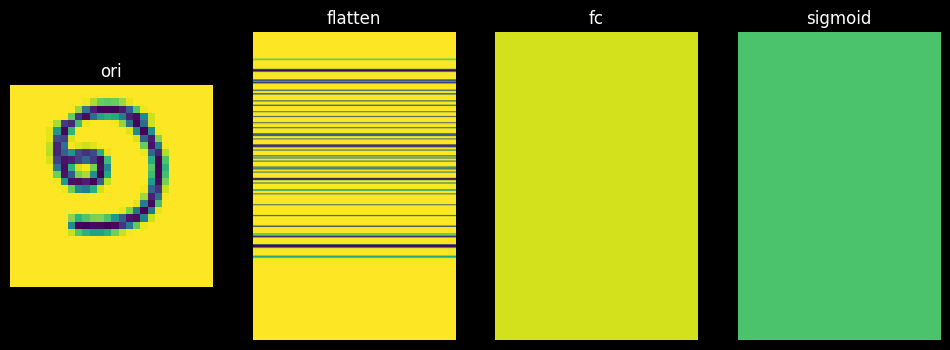

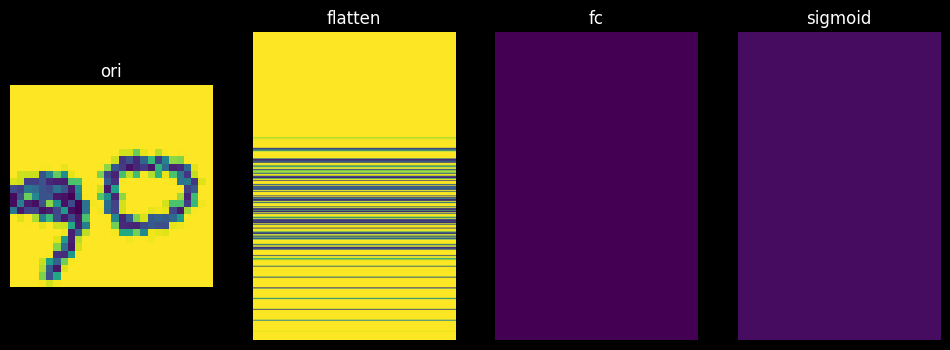

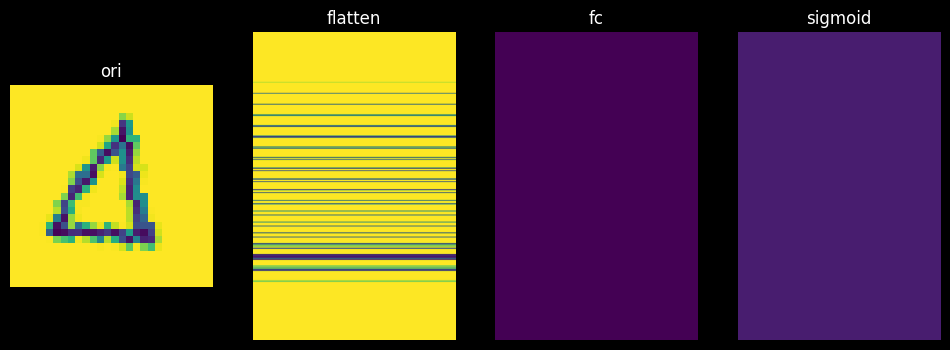

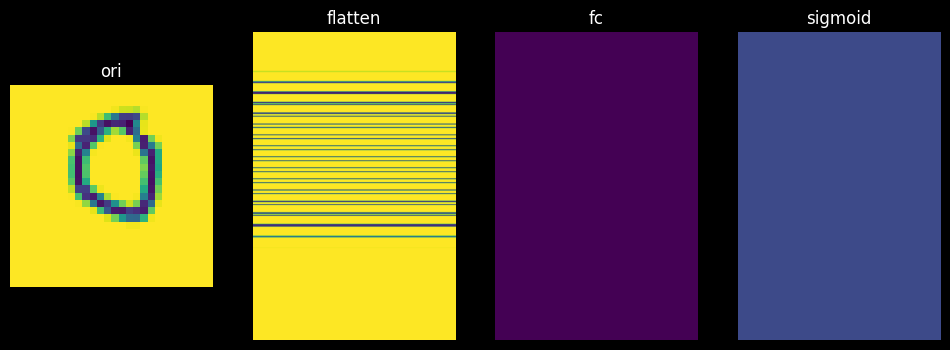

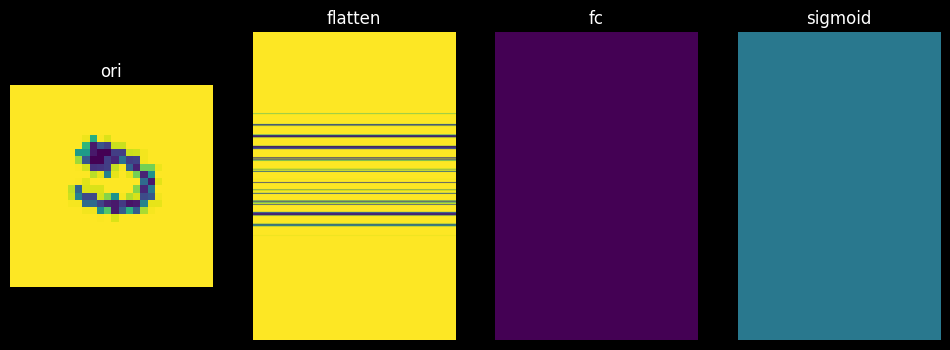

...

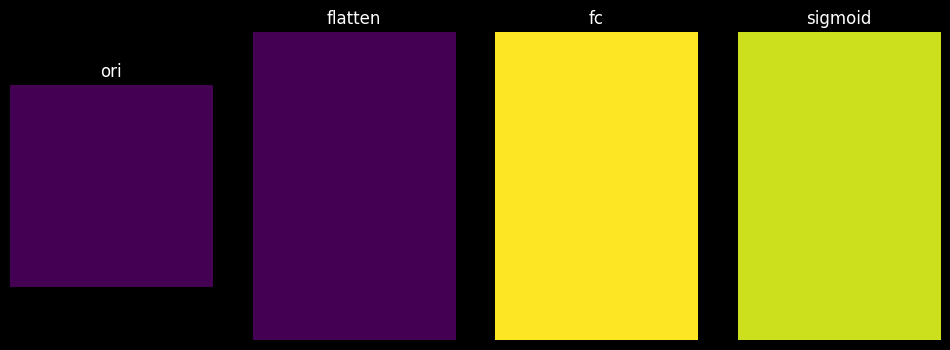

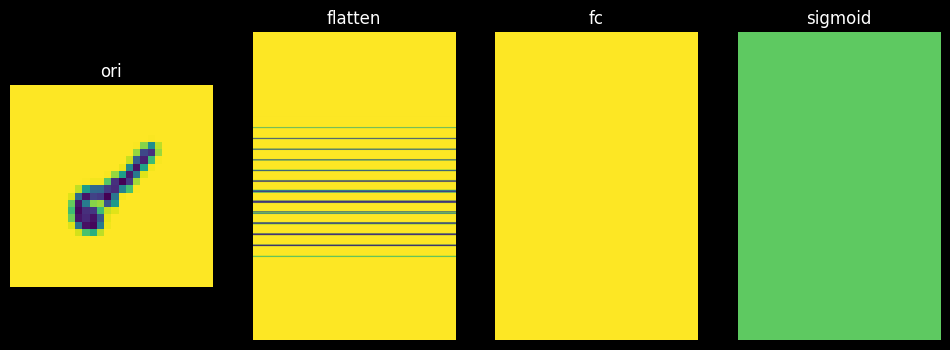

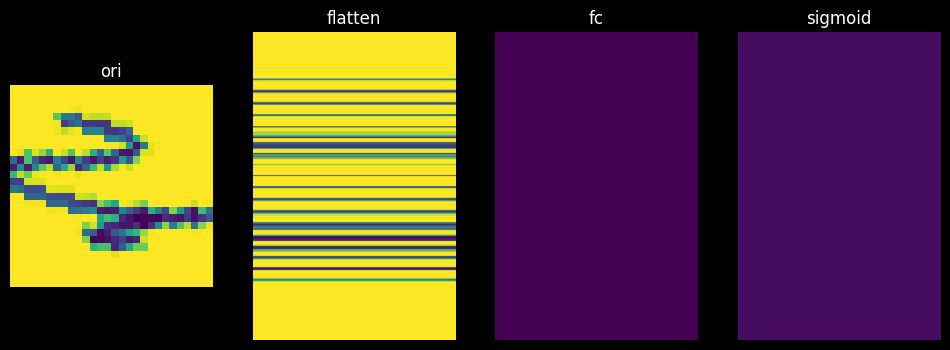

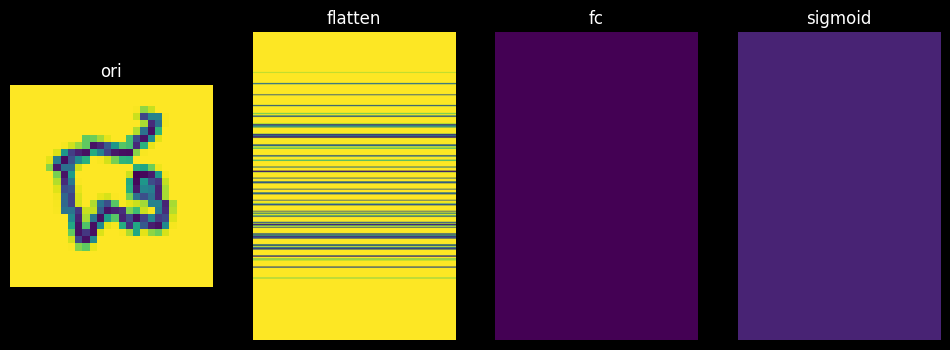

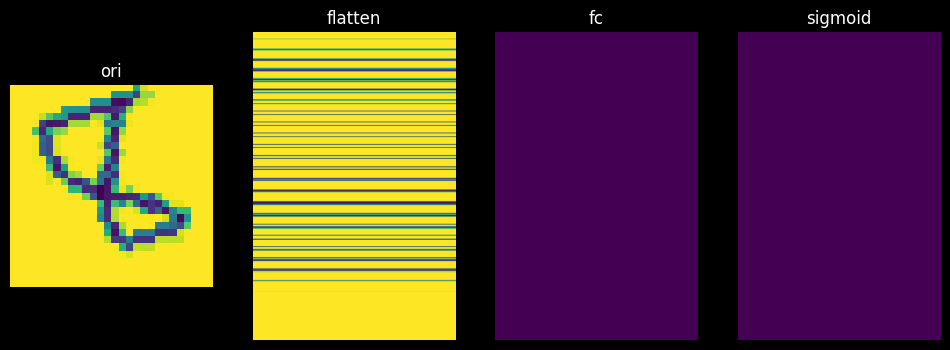

In [32]:
nn_model = NN() 
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(nn_model.parameters(), lr=0.01)

for cl in cn_and_loader:
    class_names,train_loader,test_loader  = cl
    writer = SummaryWriter(log_dir=f'runs/{class_names[0]}_{class_names[1]}/NN')

    device = 'cpu'

    nn_history = train(
        class_names,
        nn_model,
        optimizer,
        loss_fn,
        train_loader,
        test_loader,
        epochs=5,
        writer=writer,
        checkpoint_path=f"checkpoints/nn_model/{class_names}.pth",
        device=device,
    )

Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.78batch/s, loss=0.731]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.01batch/s, loss=0.609]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.95batch/s, loss=0.385]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.19batch/s, loss=0.484]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.76batch/s, loss=0.34]


Epoch 5, Loss: 0.5298, Accuracy: 0.7520, Test Loss: 0.5201, Test Accuracy: 0.8013

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.52batch/s, loss=0.537]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.67batch/s, loss=0.316]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.86batch/s, loss=0.444]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.32batch/s, loss=0.799]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.03batch/s, loss=1.02]


Epoch 5, Loss: 0.3090, Accuracy: 0.8808, Test Loss: 0.3970, Test Accuracy: 0.8205

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.64batch/s, loss=0.318]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.27batch/s, loss=0.326]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.28batch/s, loss=0.446]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.71batch/s, loss=0.513]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 14.10batch/s, loss=0.645]


Epoch 5, Loss: 0.3650, Accuracy: 0.8419, Test Loss: 0.3731, Test Accuracy: 0.8590

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.99batch/s, loss=0.4] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.70batch/s, loss=0.119]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.41batch/s, loss=0.309]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.05batch/s, loss=0.193]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.82batch/s, loss=0.336]


Epoch 5, Loss: 0.3043, Accuracy: 0.8774, Test Loss: 0.3487, Test Accuracy: 0.8910

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.55batch/s, loss=0.447]
C:\Users\USERIT\AppData\Local\Temp\ipykernel_21664\1396517491.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, len(features), figsize=(len(features)*3, 4))


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.48batch/s, loss=0.196]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.31batch/s, loss=0.238]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.95batch/s, loss=0.211]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.91batch/s, loss=0.399]


Epoch 5, Loss: 0.2265, Accuracy: 0.9113, Test Loss: 0.2881, Test Accuracy: 0.9231

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.48batch/s, loss=0.364]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.00batch/s, loss=0.818]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.05batch/s, loss=0.761]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.06batch/s, loss=0.585]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.33batch/s, loss=0.322]


Epoch 5, Loss: 0.3679, Accuracy: 0.8323, Test Loss: 0.4185, Test Accuracy: 0.8269

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.04batch/s, loss=0.445]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.76batch/s, loss=0.465]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.58batch/s, loss=0.263]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.90batch/s, loss=0.204]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.09batch/s, loss=0.286]


Epoch 5, Loss: 0.3070, Accuracy: 0.8710, Test Loss: 0.3264, Test Accuracy: 0.8782

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.24batch/s, loss=0.367]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.24batch/s, loss=0.772]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.06batch/s, loss=0.721]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.70batch/s, loss=0.187]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.11batch/s, loss=0.245]


Epoch 5, Loss: 0.3320, Accuracy: 0.8661, Test Loss: 0.3934, Test Accuracy: 0.8590

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.03batch/s, loss=0.516]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.85batch/s, loss=0.278]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.76batch/s, loss=0.114]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.38batch/s, loss=0.163]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.44batch/s, loss=1.03] 


Epoch 5, Loss: 0.2514, Accuracy: 0.8855, Test Loss: 0.2990, Test Accuracy: 0.9038

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.09batch/s, loss=0.714]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.50batch/s, loss=0.362]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.61batch/s, loss=0.381]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.11batch/s, loss=0.506]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.49batch/s, loss=0.392]


Epoch 5, Loss: 0.4382, Accuracy: 0.7942, Test Loss: 1.0837, Test Accuracy: 0.7244

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.38batch/s, loss=8.81]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.34batch/s, loss=0.803]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.94batch/s, loss=0.293]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.21batch/s, loss=0.404]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.09batch/s, loss=0.785]


Epoch 5, Loss: 0.3954, Accuracy: 0.8180, Test Loss: 1.0725, Test Accuracy: 0.7756

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.68batch/s, loss=0.322]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.92batch/s, loss=0.409]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.00batch/s, loss=0.527]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.56batch/s, loss=0.408]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.08batch/s, loss=0.438]


Epoch 5, Loss: 0.3858, Accuracy: 0.8341, Test Loss: 1.0223, Test Accuracy: 0.8013

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.97batch/s, loss=0.685]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.75batch/s, loss=8.54]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.16batch/s, loss=0.44]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.62batch/s, loss=0.218]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.77batch/s, loss=0.594]


Epoch 5, Loss: 0.2967, Accuracy: 0.8647, Test Loss: 0.9445, Test Accuracy: 0.8718

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.24batch/s, loss=0.693]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.02batch/s, loss=0.729]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.31batch/s, loss=0.468]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.01batch/s, loss=0.337]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.39batch/s, loss=0.568]


Epoch 5, Loss: 0.4643, Accuracy: 0.8084, Test Loss: 1.1260, Test Accuracy: 0.7372

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:01<00:00,  7.36batch/s, loss=0.751]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.98batch/s, loss=0.58]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.37batch/s, loss=0.261]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.41batch/s, loss=0.39]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.74batch/s, loss=9.06]


Epoch 5, Loss: 0.3461, Accuracy: 0.8341, Test Loss: 1.2184, Test Accuracy: 0.8526

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 11.56batch/s, loss=0.0964]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.31batch/s, loss=0.344]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.87batch/s, loss=0.2] 


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 13.10batch/s, loss=0.402]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.50batch/s, loss=0.253]


Epoch 5, Loss: 0.3213, Accuracy: 0.8583, Test Loss: 0.9400, Test Accuracy: 0.8590

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 11.75batch/s, loss=8.73]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.21batch/s, loss=0.561]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.98batch/s, loss=8.83]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.47batch/s, loss=0.44]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 14.55batch/s, loss=8.79]


Epoch 5, Loss: 0.3546, Accuracy: 0.8454, Test Loss: 1.2193, Test Accuracy: 0.8013

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:01<00:00,  8.00batch/s, loss=0.666]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.08batch/s, loss=0.403]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.42batch/s, loss=0.529]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.07batch/s, loss=0.653]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.58batch/s, loss=0.252]


Epoch 5, Loss: 0.4723, Accuracy: 0.8100, Test Loss: 0.5864, Test Accuracy: 0.7500

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:01<00:00,  6.52batch/s, loss=0.614]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.30batch/s, loss=0.765]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.60batch/s, loss=0.547]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.83batch/s, loss=0.492]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.06batch/s, loss=0.733]


Epoch 5, Loss: 0.3417, Accuracy: 0.8519, Test Loss: 0.4382, Test Accuracy: 0.8269

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:01<00:00,  8.28batch/s, loss=0.875]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.42batch/s, loss=0.425]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.80batch/s, loss=0.159]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.66batch/s, loss=0.277]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.42batch/s, loss=0.305]


Epoch 5, Loss: 0.3033, Accuracy: 0.8647, Test Loss: 0.3806, Test Accuracy: 0.8654

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:01<00:00,  9.93batch/s, loss=1.17]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.60batch/s, loss=0.655]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 39.25batch/s, loss=0.567]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.39batch/s, loss=0.402]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.43batch/s, loss=0.478]


Epoch 5, Loss: 0.5097, Accuracy: 0.7311, Test Loss: 0.4580, Test Accuracy: 0.8590

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.97batch/s, loss=0.777]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.36batch/s, loss=0.45]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.92batch/s, loss=0.405]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.15batch/s, loss=0.426]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.12batch/s, loss=0.28]


Epoch 5, Loss: 0.3395, Accuracy: 0.8470, Test Loss: 0.4666, Test Accuracy: 0.7949

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.92batch/s, loss=0.296]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.23batch/s, loss=0.331]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.05batch/s, loss=0.453]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.28batch/s, loss=0.314]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.39batch/s, loss=0.119]


Epoch 5, Loss: 0.3268, Accuracy: 0.8502, Test Loss: 0.2999, Test Accuracy: 0.8910

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.98batch/s, loss=0.608]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.47batch/s, loss=0.333]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.14batch/s, loss=0.247]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.40batch/s, loss=0.66]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.01batch/s, loss=0.56]


Epoch 5, Loss: 0.2616, Accuracy: 0.8873, Test Loss: 0.3955, Test Accuracy: 0.8782

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.07batch/s, loss=0.585]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.79batch/s, loss=0.715]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.47batch/s, loss=0.474]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.17batch/s, loss=0.443]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.37batch/s, loss=0.518]


Epoch 5, Loss: 0.4801, Accuracy: 0.7968, Test Loss: 0.4511, Test Accuracy: 0.8269

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.81batch/s, loss=0.581]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.92batch/s, loss=0.145]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.24batch/s, loss=0.612]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.34batch/s, loss=0.423]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.37batch/s, loss=0.687]


Epoch 5, Loss: 0.3384, Accuracy: 0.8726, Test Loss: 0.3448, Test Accuracy: 0.9038

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.84batch/s, loss=0.823]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.89batch/s, loss=0.977]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 32.49batch/s, loss=0.394]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.70batch/s, loss=0.701]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 37.43batch/s, loss=0.181]


Epoch 5, Loss: 0.4978, Accuracy: 0.7968, Test Loss: 0.4530, Test Accuracy: 0.8333

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 33.60batch/s, loss=0.65]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 34.96batch/s, loss=0.747]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 36.94batch/s, loss=0.808]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.96batch/s, loss=0.372]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.59batch/s, loss=0.392]


Epoch 5, Loss: 0.5122, Accuracy: 0.7742, Test Loss: 0.4910, Test Accuracy: 0.8077

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 30.04batch/s, loss=0.502]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 35.75batch/s, loss=0.508]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.40batch/s, loss=0.552]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.09batch/s, loss=0.674]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.59batch/s, loss=0.323]


Epoch 5, Loss: 0.3761, Accuracy: 0.8484, Test Loss: 0.3863, Test Accuracy: 0.8654

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.72batch/s, loss=1.09]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 12.08batch/s, loss=0.729]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.51batch/s, loss=0.778]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.53batch/s, loss=0.496]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.66batch/s, loss=0.311]


Epoch 5, Loss: 0.4557, Accuracy: 0.7548, Test Loss: 0.4308, Test Accuracy: 0.8141

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.76batch/s, loss=0.661]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.22batch/s, loss=0.589]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.81batch/s, loss=0.413]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 29.01batch/s, loss=0.433]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.08batch/s, loss=0.363]


Epoch 5, Loss: 0.5533, Accuracy: 0.7339, Test Loss: 0.4722, Test Accuracy: 0.7692

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.70batch/s, loss=0.772]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.19batch/s, loss=0.723]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.13batch/s, loss=0.691]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.73batch/s, loss=0.657]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.45batch/s, loss=0.623]


Epoch 5, Loss: 0.6849, Accuracy: 0.5048, Test Loss: 0.6073, Test Accuracy: 0.6667

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.75batch/s, loss=0.59]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.27batch/s, loss=0.476]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.94batch/s, loss=0.437]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.11batch/s, loss=1.09]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.55batch/s, loss=0.398]


Epoch 5, Loss: 0.4456, Accuracy: 0.7968, Test Loss: 0.7224, Test Accuracy: 0.6667

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.82batch/s, loss=0.532]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 27.77batch/s, loss=0.544]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.52batch/s, loss=0.529]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.50batch/s, loss=0.525]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.12batch/s, loss=0.485]


Epoch 5, Loss: 0.5339, Accuracy: 0.7613, Test Loss: 0.4946, Test Accuracy: 0.7372

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.27batch/s, loss=0.465]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.54batch/s, loss=0.544]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.24batch/s, loss=0.496]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.36batch/s, loss=0.444]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.36batch/s, loss=0.515]


Epoch 5, Loss: 0.4805, Accuracy: 0.7403, Test Loss: 0.5654, Test Accuracy: 0.6859

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.10batch/s, loss=0.595]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.86batch/s, loss=0.289]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.26batch/s, loss=0.443]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.73batch/s, loss=0.411]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.47batch/s, loss=0.586]


Epoch 5, Loss: 0.3631, Accuracy: 0.8597, Test Loss: 0.3964, Test Accuracy: 0.8205

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.95batch/s, loss=0.216]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.86batch/s, loss=0.479]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.05batch/s, loss=0.672]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.23batch/s, loss=0.349]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.57batch/s, loss=0.252]


Epoch 5, Loss: 0.3930, Accuracy: 0.8468, Test Loss: 0.4442, Test Accuracy: 0.8141

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.30batch/s, loss=0.928]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.96batch/s, loss=0.595]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 24.03batch/s, loss=0.575]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.24batch/s, loss=0.386]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.81batch/s, loss=0.88]


Epoch 5, Loss: 0.4284, Accuracy: 0.8355, Test Loss: 0.5078, Test Accuracy: 0.8269

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.59batch/s, loss=0.416]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.27batch/s, loss=0.387]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.45batch/s, loss=0.295]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 11.28batch/s, loss=0.381]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 10.99batch/s, loss=0.431]


Epoch 5, Loss: 0.4431, Accuracy: 0.8242, Test Loss: 0.4596, Test Accuracy: 0.7949

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.84batch/s, loss=0.733]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.18batch/s, loss=0.704]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.37batch/s, loss=0.695]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 23.19batch/s, loss=0.679]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.83batch/s, loss=1.05]


Epoch 5, Loss: 0.6813, Accuracy: 0.5516, Test Loss: 0.7669, Test Accuracy: 0.5064

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 26.20batch/s, loss=0.668]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.76batch/s, loss=0.604]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.11batch/s, loss=0.452]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 25.90batch/s, loss=0.535]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.70batch/s, loss=0.527]


Epoch 5, Loss: 0.4652, Accuracy: 0.8129, Test Loss: 0.4581, Test Accuracy: 0.8077

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.96batch/s, loss=0.262]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.66batch/s, loss=0.663]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.16batch/s, loss=0.194]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 21.21batch/s, loss=0.176]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.57batch/s, loss=0.706]


Epoch 5, Loss: 0.4189, Accuracy: 0.8290, Test Loss: 0.4356, Test Accuracy: 0.8654

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.49batch/s, loss=0.773]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.18batch/s, loss=0.781]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 31.00batch/s, loss=0.696]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.48batch/s, loss=0.688]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.74batch/s, loss=0.91]


Epoch 5, Loss: 0.7345, Accuracy: 0.5097, Test Loss: 0.7773, Test Accuracy: 0.5000

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 15.18batch/s, loss=0.711]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.73batch/s, loss=0.732]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 17.08batch/s, loss=0.68]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 13.87batch/s, loss=0.739]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 19.81batch/s, loss=0.735]


Epoch 5, Loss: 0.7333, Accuracy: 0.4903, Test Loss: 0.7349, Test Accuracy: 0.5000

3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 16.96batch/s, loss=0.696]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 28.78batch/s, loss=0.686]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 22.33batch/s, loss=0.717]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 20.20batch/s, loss=0.717]


3 1
1 784
1 48
1 48
1 1
1 1


Testing 🧐🧐: 100%|██████████| 10/10 [00:00<00:00, 18.88batch/s, loss=0.65]


Epoch 5, Loss: 0.7096, Accuracy: 0.4758, Test Loss: 0.7066, Test Accuracy: 0.5000

3 1
1 784
1 48
1 48
1 1
1 1


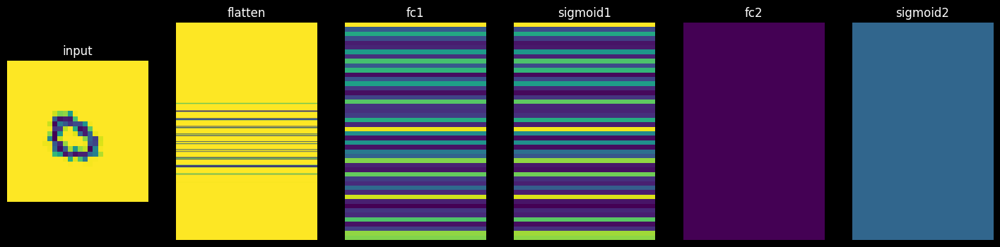

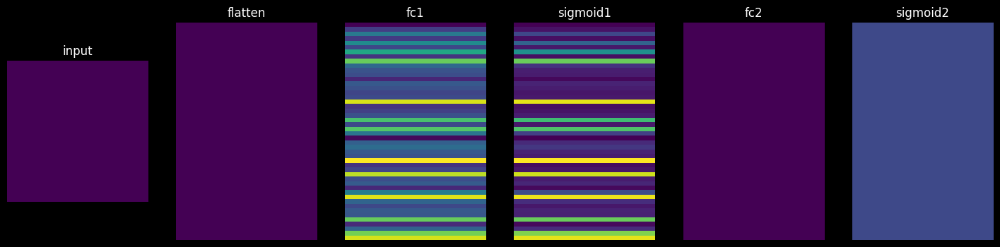

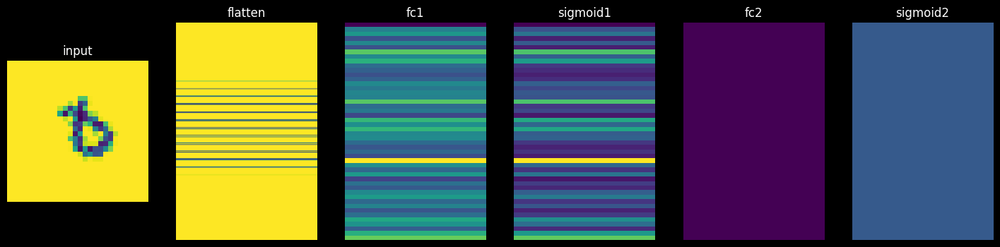

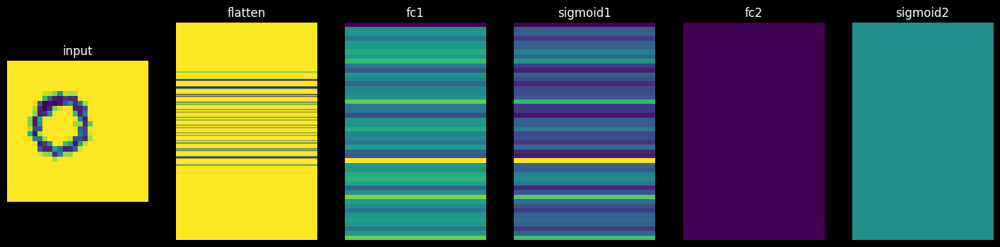

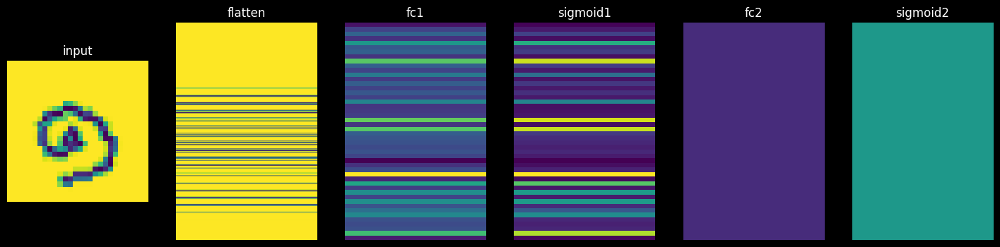

...

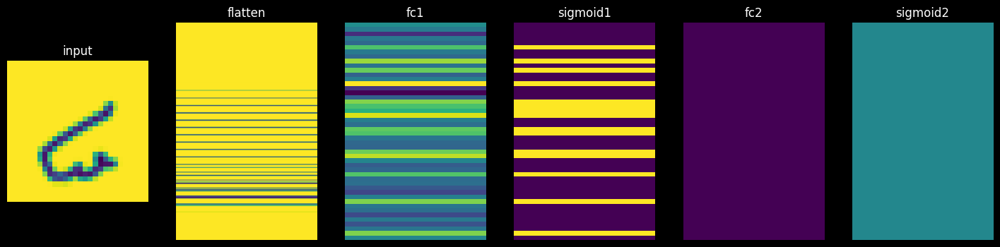

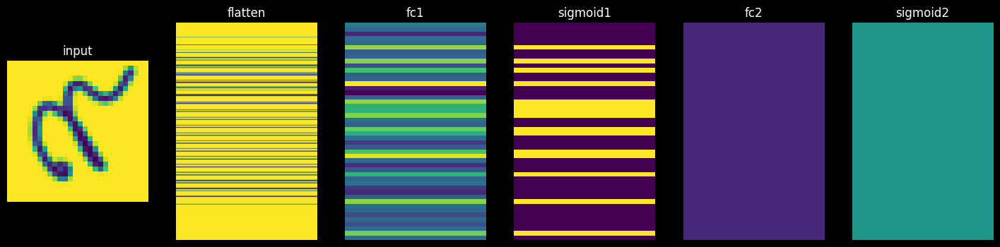

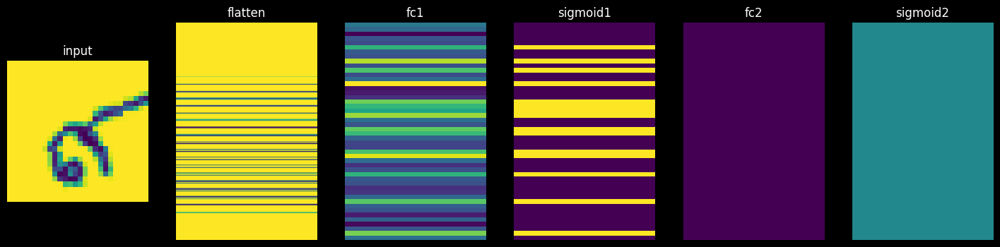

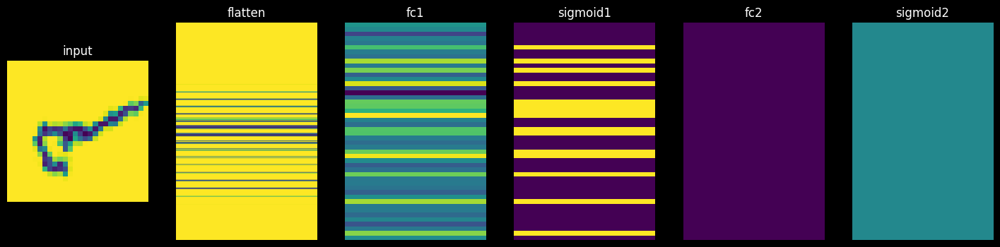

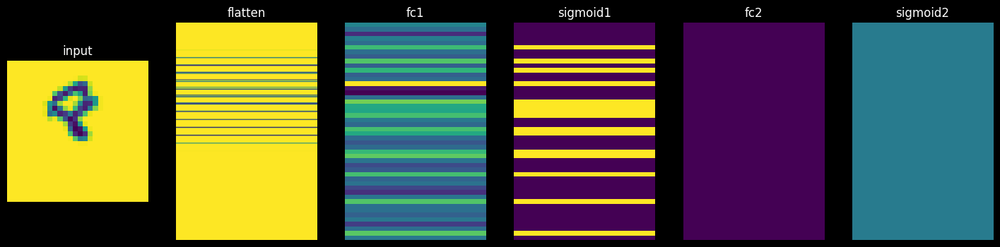

In [33]:

mlp_model = MLP() 
loss_fn = nn.BCELoss()
optimizer = torch.optim.SGD(mlp_model.parameters(), lr=0.03, momentum=0.9)

for cl in cn_and_loader:
    class_names,train_loader,test_loader  = cl
    writer = SummaryWriter(log_dir=f'runs/{class_names[0]}_{class_names[1]}/MLP')
    device = 'cpu'

    mlp_history = train(
        class_names,
        mlp_model,
        optimizer,
        loss_fn,
        train_loader,
        test_loader,
        epochs=5,
        writer=writer,
        checkpoint_path=f"checkpoints/mlp_model/{class_names}.pth",
        device=device,
    )

Try to load the weights into the model and the confusion matrix for each model with every combination of numbers that you've obtained, as shown in the expected output.


<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
This is just an example of NN. You should have three models: NN, MLP, and CNN, with one model per plot.

![image.png](https://github.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/blob/main/Lab4_NN-and-CNN/assets/09.png?raw=true)

</details>

📥 Loading model from: checkpoints/cnn_model\['0', '1'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '2'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '3'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '4'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '5'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '6'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '7'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '8'].pth
📥 Loading model from: checkpoints/cnn_model\['0', '9'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '2'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '3'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '4'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '5'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '6'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '7'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '8'].pth
📥 Loading model from: checkpoints/cnn_model\['1', '9'].p

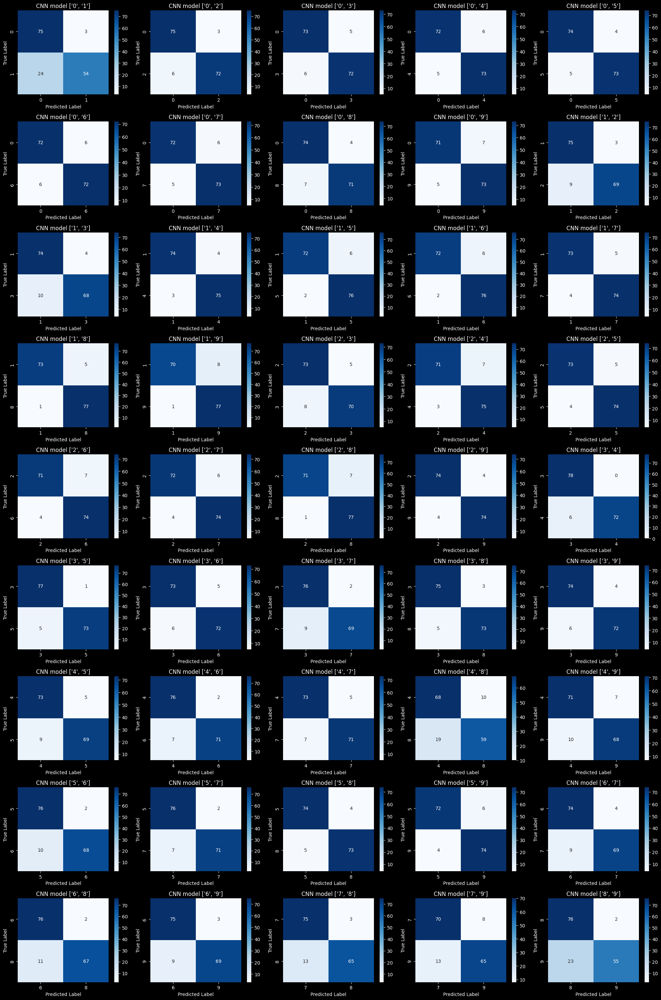

In [34]:
### START CODE HERE ###
from sklearn.metrics import confusion_matrix
import seaborn as sn

def plot_confusion_matrix(loaded_models, model_name, cn_and_loader, device):
    
    fig, axs = plt.subplots(9, 5, figsize=(20, 30))
    axs = axs.flatten()

    for i, (model, (class_names, _,test_loader)) in enumerate(zip(loaded_models, cn_and_loader)):
        all_preds = []
        all_labels = []

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                preds = (outputs > 0.6).int().squeeze()

                class_ints = list(map(int, class_names))  
                pred_classes = [class_ints[i] for i in preds.cpu().numpy()]  
                all_preds.extend(pred_classes)
                all_labels.extend(labels.cpu().numpy())
   
        cm = confusion_matrix(all_labels, all_preds)

        sn.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=class_names, yticklabels=class_names,
                    ax=axs[i])
        axs[i].set_xlabel('Predicted Label')
        axs[i].set_ylabel('True Label')
        axs[i].set_title(f'{model_name} {class_names}')

    plt.tight_layout()
    plt.show()

model_folder = 'checkpoints/cnn_model'  # หรือ 'checkpoints\\cnn_model' สำหรับ Windows
model_paths = [os.path.join(model_folder, f) 
               for f in os.listdir(model_folder) 
               if f.endswith('.pth')]

loaded_models = []

for path in model_paths:
    print(f"📥 Loading model from: {path}")
    model_instance = CNN()  
    model_instance.load_state_dict(torch.load(path, weights_only=True))
    model_instance.eval()
    loaded_models.append(model_instance)

plot_confusion_matrix(loaded_models,'CNN model',cn_and_loader, 'cpu')
### END CODE HERE ###

Questions
1. How does the performance of different models vary across different pairs of numbers in our dataset?
2. Can you identify the number pairs where the Neural Network model performs best and worst? Explain why the NN model is able/unable to classify these specific pairs based on the visualization of feature maps of each node in each layer.
3. Analyze and compare how MLP and CNN models perform on the dataset compared to the Neural Network model.  Identify scenarios where MLP and CNN outperform or underperform the NN. Explain the reasons behind these performance differences. Consider factors like the underlying structure of the data and the specific strengths of each model architecture.
4. According to your observations from questions 1-3, propose specific strategies to improve the performance of each model (NN, MLP, CNN) on this dataset. Consider factors such as data preprocessing, data augmentation, or potential changes to the model architecture itself. Justify your suggestions based on the strengths and limitations identified in the previous questions.

## Answer ##
1.  CNN เป็นโมเดลที่สามารถแยกคู่ตัวเลขได้ดีที่สุด
    MLP สามารถแยกคู่ตัวเลยได้รองลงมาจาก CNN แต่มีกรณีที่โมลเดล predict ได้ผลลัพธ์เป็นคลาสเดียวกันทั้งหมด (๓ ๖, ๗ ๘)
    NN สามารถแยกคู่ตัวเลยได้รองลงมาจาก MLP ถึงแม้จะไม่มีสถานการณ์ที่โมเดล predict ได้ผลลัพธ์เดียวกันทั้งหมด แต่โมลเดลก็มีความแม่นยำน้อบกว่า MLP อย่างเห็นได้ชัด ส่วนใหญ่ผลลัพธ์ที่ได้จากกการ predict จะเป็น true และ false ปนกัน เกือบครึ่งต่อครึ่ง และมี True Positive และ True Negative น้อยกว่า MLP
    สาเหตุที่ CNN แยกคู่ตัวเลขได้ดีที่สุด เพราะ CNN เป็นโมเดลที่สามารถเข้าใจความสัมพันธ์ 2 มิติได้ (ซ้ายขวา บนล่าง) แต่โมเดลอื่นทำไม่ได้ ทำให้ CNN สามารถทำความเข้าใจลักษณะภาพได้ดีกว่าโมเดลอื่นๆ
2.  คู่เลขที่ง่าย คือ 0 กับ 1 เพราะลักษณะของตัวเลขทั้งสองมีความต่างกันอย่างชัดเจน เลข 0 มีลักษณะลม ๆ และเลข 1 เป็นเหมือนเส้นตรง ทำให้ง่ายต่อการจำแนก
    คู่เลขที่ยาก คือ 4 กับ 9 เพราะมีลักษณะที่คล้ายกัน หากเราเขียนเลข 4 โดยมีขีดยาวนิดนึง อาจจะทำให้มองเห็นเป็นเลข 9 ได้
3.  • MLP และ CNN มี layer ของการทำงานมากกว่า NN โดยที่
        - CNN มี convolutional layers with ReLU activations  2 ชั้น จากนั้น flatten ตามด้วย fully connected layers with ReLU activations อีก 2 ชั้น จากนั้นจึงใช้ sigmoid activation รวมเป็น 6 ชั้น
        - MLP มี flatten ตามด้วย fully connected layer with sigmoid activation 2 ชั้น รวมเป็น 3 ชั้น
        - NN มีแค่ flattens และ fully connected layer with sigmoid activation รวมเป็น 2 ชั้น
    • สถานการณ์ที่ MLP และ CNN ทำงานได้ดีกว่า NN: กรณีตัวเลขมีลักษณะคล้ายกันในบางจุด แต่ต่างกันใน pattern รวม เช่น ๔ ๙
    • ความแตกต่างของประสิทธิภาพ เกิดจาก ความซับซ้อนของ layer ใน model 
        - CNN ใช้ทั้ง convolutional layers และ ด้วย fully connected layers ทำให้สามารถเข้าใจโครงสร้างของภาพได้ดี รู้ความสำคัญของตำแหน่ง ซ้ายขวา บนล่าง โมเดลเหมาะกับข้อมูลที่เป็น 2 มิติ
        - MLP มี fully connected layer 2 ชั้น ทำให้ model พอจะรู้ pattern ของตัวเลขได้มาก แต่ไม่เท่า CNN เพราะโมเดลเหมาะกับข้อมูลที่เป็น 1 มิติมากกว่า
        - NN มี fully connected layer 1 ชั้น ทำให้ไม่สามารถแยกแยะตัวเลขที่มีรูปคล้ายกันได้
4.  NN
    - เพิ่ม hidden layer และ Augment data เพื่อให้โมเดลสามารถแยกคู่เลขที่ยากได้ดียิ่งขึ้น
    MLP
    - เพิ่ม hidden layer และ ใช้ Flatten + Dropout ป้องกัน overfitting
    CNN
    - ใช้ data augmentation เช่น random crop, rotation และปรับ kernel size หรือ depth ของ convolutional layer ตามความซับซ้อนของลายมือ